## This is the second notebook for the analysis of Ba$_4$NbRu$_3$O$_{12}$ data, the isolated magnetic scattering is assumed to be generated before this point. 

In [1]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import sys
import os
#Perform the necessary pull of some helper functions.
import lmfit
from lmfit import Model
import scipy
import matplotlib
import matplotlib.pyplot as plt
# To match plot styles in the draft.
plt.rcParams['xtick.direction']='in'
plt.rcParams['ytick.direction']='in'
plt.rcParams['xtick.minor.visible']=True
plt.rcParams['ytick.minor.visible']=True
plt.rcParams['xtick.top']=True
plt.rcParams['ytick.right']=True
plt.rcParams['font.size']=10
plt.rcParams['xtick.labelsize']=10
plt.rcParams['ytick.labelsize']=10
plt.rcParams['text.usetex']=False
plt.rcParams['font.family']='serif'
%matplotlib inline
import bnrof
from mantid.simpleapi import *
import MDUtils as mdu
from bnrof import IEXY_data
from bnrof import Material
from mantid.geometry import CrystalStructure, ReflectionGenerator, ReflectionConditionFilter

FrameworkManager-[Notice] Welcome to Mantid 6.7.0
FrameworkManager-[Notice] Please cite: http://dx.doi.org/10.1016/j.nima.2014.07.029 and this release: http://dx.doi.org/10.5286/Software/Mantid6.7


Combine the measurements to perform the factorization as described in the text


In [2]:
#Load the NXS files. 

Ei50_mag = LoadMD('Isolated Magnetic NXS Files/SEQ_Ei50_mag.nxs')
Ei25_mag = LoadMD('Isolated Magnetic NXS Files/SEQ_Ei25_mag.nxs')
Ei10_mag = LoadMD('Isolated Magnetic NXS Files/SEQ_Ei10_mag.nxs')


#Clean up kinematic limits
kin_50=bnrof.mask_minQ_fixedEi_MD(Ei50_mag,4,50.0).clone()
kin_25=bnrof.mask_minQ_fixedEi_MD(Ei25_mag,4,25.0).clone()
kin_10=bnrof.mask_minQ_fixedEi_MD(Ei10_mag,4.0,10.5).clone()

stitch_MD = bnrof.stitch_MD([kin_10,kin_25,kin_50],q_limits=[[0,1.6],[0,2.8],[0,4]],\
                              e_limits=[[1.3,4],[0,14],[4,45]],mode='overwrite').clone()
#Below only uses the 25 and 50 meV measurements
#stitch_MD = bnrof.stitch_MD([kin_25,kin_50],q_limits=[[0,2.8],[0,4]],\
#                              e_limits=[[0,14],[4,45]],mode='overwrite').clone()
I_stitch = np.copy(stitch_MD.getSignalArray())
I_stitch[I_stitch==0]=np.nan
stitch_MD.setSignalArray(I_stitch)


LoadMD-[Notice] LoadMD started
DownloadInstrument-[Notice] All instrument definitions up to date
LoadMD-[Notice] LoadMD successful, Duration 0.69 seconds
LoadMD-[Notice] LoadMD started
LoadMD-[Notice] LoadMD successful, Duration 0.37 seconds
LoadMD-[Notice] LoadMD started
LoadMD-[Notice] LoadMD successful, Duration 0.27 seconds
CloneWorkspace-[Notice] CloneWorkspace started
CloneWorkspace-[Notice] CloneWorkspace successful, Duration 0.01 seconds
CloneWorkspace-[Notice] CloneWorkspace started
CloneWorkspace-[Notice] CloneWorkspace successful, Duration 0.00 seconds
CloneWorkspace-[Notice] CloneWorkspace started
CloneWorkspace-[Notice] CloneWorkspace successful, Duration 0.01 seconds
CloneWorkspace-[Notice] CloneWorkspace started
CloneWorkspace-[Notice] CloneWorkspace successful, Duration 0.00 seconds
CloneWorkspace-[Notice] CloneWorkspace started
CloneWorkspace-[Notice] CloneWorkspace successful, Duration 0.01 seconds
CloneWorkspace-[Notice] CloneWorkspace started
CloneWorkspace-[Notice]

## Main figure of the magnetic scattering is generated below. 

In [3]:
%matplotlib inline

CloneWorkspace-[Notice] CloneWorkspace started
CloneWorkspace-[Notice] CloneWorkspace successful, Duration 0.00 seconds
CloneWorkspace-[Notice] CloneWorkspace started
CloneWorkspace-[Notice] CloneWorkspace successful, Duration 0.00 seconds


Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


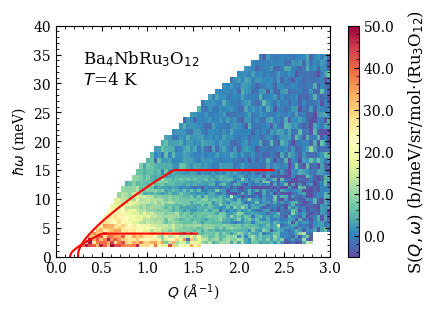

In [4]:
#Second plot is the magnetic scattering. 
mdplt = stitch_MD.clone()
#mdplt /=4.0*np.pi

fig,ax = plt.subplots(1,1,figsize=(3.54,3.0),subplot_kw={'projection':'mantid'})

vmax=0.05
vmin=-vmax/10
mdplt_unnorm = mdplt.clone()
mdplt_unnorm = bnrof.undo_normalize_MDHisto_event(mdplt_unnorm)
ax.pcolormesh(mdplt_unnorm,vmin=vmin,vmax=vmax,cmap='Spectral_r')
ax.tick_params(axis='both',labelsize=10)
ax.set_ylabel('$\hbar\omega$ (meV)')
ax.set_xlabel('$Q$ ($\AA^{-1}$)')
ax.text(0.1,0.9,'Ba$_4$NbRu$_3$O$_{12}$ \n$T$=4 K',transform=ax.transAxes,fontsize=12,verticalalignment='top',horizontalalignment='left')
ax.set_xlim(0,3)
ax.set_ylim(0,40)
#Draw barrier between Ei's
qkin = np.linspace(0,8,100)
qkin,ekin = bnrof.minQseq(25.0,4.0)
ekin[ekin>15]=15.0
ax.plot(qkin,ekin,'r-')

qkin = np.linspace(0,8,100)
qkin,ekin = bnrof.minQseq(10.5,4.0)
ekin[ekin>4]=4.0
ax.plot(qkin,ekin,'r-')

#Draw barrier between Ei's
qkin = np.linspace(0,1.4,100)
qkin,ekin = bnrof.minQseq(15.0,5.0)
ekin[ekin>5]=5.0
ekin[qkin>1.2]=np.nan
#ax.plot(qkin,ekin,'r-')
#Add a colorbar 
l,b,w,h=ax.get_position().bounds
cax = fig.add_axes([l+w+0.05,b,0.03,h])
cax.tick_params(labelleft=False,labelright=True,labelbottom=False)
cmap = plt.get_cmap('Spectral_r')
norm = matplotlib.colors.Normalize(vmin=vmin*1000,vmax=vmax*1000)
sm = plt.cm.ScalarMappable(cmap=cmap,norm=norm)
sm.set_array([])
cb = matplotlib.colorbar.ColorbarBase(cax,cmap=cmap,norm=norm,orientation='vertical')
labelstr=r'S($Q,\omega$) (b/meV/sr/mol$\cdot$(Ru$_3$O$_{12}$)'
cax.text(5.5,0.5,labelstr,fontsize=12,rotation=90,transform=cax.transAxes,horizontalalignment='left',verticalalignment='center')
cax.yaxis.set_major_formatter(matplotlib.ticker.FormatStrFormatter("%.1f"))
fig.savefig('SEQ_figs/BNRO_magscatter.pdf',bbox_inches='tight',dpi=300)
fig.show()

## Evaluate some sum rules below:


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.04 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
mu_eff = 2.240905944807358


The keyword argument kws does not match any arguments of the model function. It will be ignored.


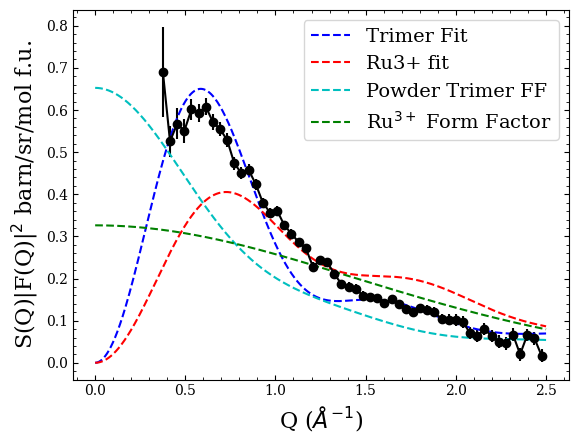

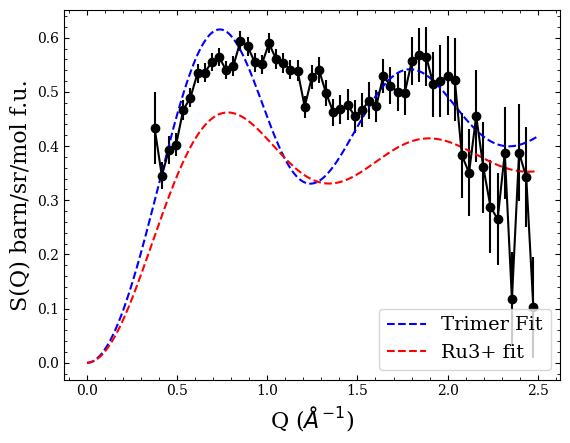

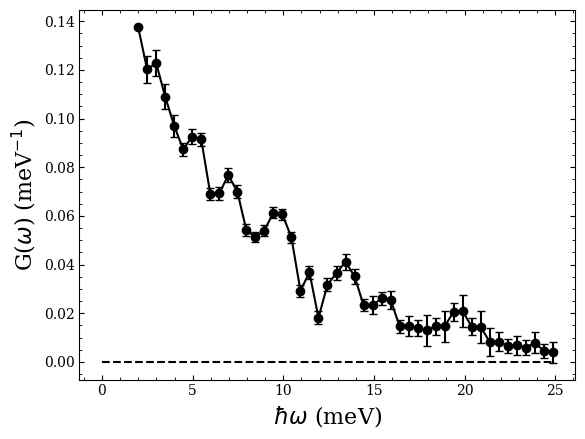

In [44]:
def sq_model(Q,FF,A,d):
    out=A*FF*(1.0-np.sin(Q*d)/(Q*d))
    return out

do= np.array([0.0,0.0,2.54])
#do=np.array([0.0,0.0,0.0001])
d_nn = np.array([5.75,0.0,0.0])
d_nnn = np.array([5.75+5.75*np.cos(60.0*np.pi/180.0),5.75*np.sin(60.0*np.pi/180.0),0.0])
d_2a = np.array([2.0*5.75,0.0,0.0])

def trimer_sq_firstmoment_NN(Q,A,FF_ion):

    dovec=np.array([0.0,0.0,2.54])
    dvec = np.array([5.75,0.0,0.0])
    '''
    See BNRO draft appendix for full details. Function takes the following:
    Q- numpy vector of Q points to evalaute 
    A - overall scaling factor
    dvec - numpy vector denoting the particular magnetic interaction displacement vector in Angstrom
    dovec - numpy vector denoting Ru-Ru bond vector
    FF_ion - numpy array of magnetic form factor for the free ion of the same shape as Q
    '''
    d0 = np.linalg.norm(dovec)
    d = np.linalg.norm(dvec)
    A1 = FF_ion /9.0
    B = 3.0+2.0*np.sin(2.0*Q*d0)/(2.0*Q*d0)+4.0*np.sin(Q*d0)/(Q*d0)
    C = 3.0*np.sin(Q*d)/(Q*d) + \
        np.sin(Q*np.linalg.norm(np.subtract(2.0*dovec,dvec)))/(Q*np.linalg.norm(np.subtract(2.0*dovec,dvec)))+\
        np.sin(Q*np.linalg.norm(np.add(2.0*dovec,dvec)))/(Q*np.linalg.norm(np.add(2.0*dovec,dvec)))+\
        2.0*np.sin(Q*np.linalg.norm(np.subtract(dovec,dvec)))/(Q*np.linalg.norm(np.subtract(dovec,dvec)))+\
        2.0*np.sin(Q*np.linalg.norm(np.add(dovec,dvec)))/(Q*np.linalg.norm(np.add(dovec,dvec)))
    s_q = A*A1*(B - C)
    return s_q

def trimer_sq_firstmoment_NNN(Q,A,FF_ion):

    dovec=np.array([0.0,0.0,2.54])
    dvec =np.array([5.75+5.75*np.cos(60.0*np.pi/180.0),5.75*np.sin(60.0*np.pi/180.0),0.0])
    '''
    See BNRO draft appendix for full details. Function takes the following:
    Q- numpy vector of Q points to evalaute 
    A - overall scaling factor
    dvec - numpy vector denoting the particular magnetic interaction displacement vector in Angstrom
    dovec - numpy vector denoting Ru-Ru bond vector
    FF_ion - numpy array of magnetic form factor for the free ion of the same shape as Q
    '''
    d0 = np.linalg.norm(dovec)
    d = np.linalg.norm(dvec)
    A1 = FF_ion /9.0
    B = 3.0+2.0*np.sin(2.0*Q*d0)/(2.0*Q*d0)+4.0*np.sin(Q*d0)/(Q*d0)
    C = 3.0*np.sin(Q*d)/(Q*d) + \
        np.sin(Q*np.linalg.norm(np.subtract(2.0*dovec,dvec)))/(Q*np.linalg.norm(np.subtract(2.0*dovec,dvec)))+\
        np.sin(Q*np.linalg.norm(np.add(2.0*dovec,dvec)))/(Q*np.linalg.norm(np.add(2.0*dovec,dvec)))+\
        2.0*np.sin(Q*np.linalg.norm(np.subtract(dovec,dvec)))/(Q*np.linalg.norm(np.subtract(dovec,dvec)))+\
        2.0*np.sin(Q*np.linalg.norm(np.add(dovec,dvec)))/(Q*np.linalg.norm(np.add(dovec,dvec)))
    s_q = A*A1*(B - C)
    return s_q


#Form factors for both trimer and ion
ff_ion = 1.0/mq
model = lmfit.Model(sq_model,prefix='d1_',independent_vars=['Q','FF'])
params=model.make_params()
params.add('d1_A',vary=True,value=100.0,min=-1000,max=1000)
params.add('d1_d',vary=False,value=5.75,min=0,max=100)
result_ru=model.fit(sq_fq,Q=q_arr,params=params,FF=ff_ion,weights = 1.0/sq_fq_err,method='powell')

model_trimer = Model(trimer_sq_firstmoment_NN,prefix='d1_',independent_vars=['Q','FF_ion'])
trimer_params=model_trimer.make_params()
trimer_params.add('d1_A',value=10.0,min=-1000.0,max=1000.0)
trimer_result = model_trimer.fit(sq_fq,Q=q_arr,FF_ion=ff_ion,params=trimer_params,method='powell',kws={'dvec':d_nn,'dovec':do})

q_eval = np.linspace(0.001,2.5,1000)
ff_eval = 1.0/(bnrof.get_MANTID_magFF(q_eval,'Ru0')[1])
ru_eval = model.eval(Q=q_eval,params=result_ru.params,FF=ff_eval)
trimer_eval = model_trimer.eval(Q=q_eval,FF_ion=ff_eval,params=trimer_result.params)

#Need to divide by form factors to get S(Q)
def integrand(x,Q,d0):
    return (1.0+2.0*np.cos(Q*d0*x))**2

def qdep_FF_trimer_numerical(Q,d0,ion):
    q,ff = bnrof.get_MANTID_magFF(Q,ion)
    ff_ion = 1.0/ff
    ff_trimer = np.zeros(len(ff_ion))
    for i in range(len(q)):
        I= scipy.integrate.quad(integrand,a=-1,b=1,args=(q[i],d0))[0]
        ff_trimer[i] = I * ff_ion[i]/9.0
    return ff_trimer

ff_trimer_avg = qdep_FF_trimer_numerical(q_eval,2.54,'Ru0')
ff_trimer_arr = qdep_FF_trimer_numerical(q_arr,2.54,'Ru0')


plt.figure()
plt.errorbar(q_arr,sq_fq,yerr=sq_fq_err,marker='o',color='k')
plt.plot(q_eval,trimer_eval,'b--',label='Trimer Fit')
plt.plot(q_eval,ru_eval,'r--',label='Ru3+ fit')
plt.plot(q_eval,np.nanmax(trimer_eval)*ff_trimer_avg/2.0,'c--',label='Powder Trimer FF')
plt.plot(q_eval,np.nanmax(trimer_eval)*ff_eval/2.0,'g--',label='Ru$^{3+}$ Form Factor' )

plt.xlabel('Q ($\AA^{-1}$)',fontsize=16)
plt.ylabel('S(Q)|F(Q)|$^2$ barn/sr/mol f.u.',fontsize=16)
plt.legend(fontsize=14)
#plt.ylim(0,2)

plt.figure()
plt.errorbar(q_arr,sq_fq/ff_trimer_arr,yerr=sq_fq_err/ff_trimer_arr,marker='o',color='k')
plt.plot(q_eval,trimer_eval/ff_trimer_avg,'b--',label='Trimer Fit')
plt.plot(q_eval,ru_eval/ff_eval,'r--',label='Ru3+ fit')
plt.xlabel('Q ($\AA^{-1}$)',fontsize=16)
plt.ylabel('S(Q) barn/sr/mol f.u.',fontsize=16)
plt.legend(fontsize=14)

sq_eval = trimer_eval/ff_trimer_avg
sq_eval_mu = sq_eval/1.0
sq_fq_mu = sq_fq/1.0
sq_qsqr_int = np.trapz(x=q_arr,y=(sq_fq_mu/ff_trimer_arr) * q_arr**2) #This method uses the data points
#sq_qsqr_int = np.trapz(x=q_eval,y=(sq_eval_mu/ff_trimer_avg) * q_eval**2) #This method uses the fit
qsqr_int = np.trapz(x=q_eval,y=q_eval**2)
g=2.0
sqscale = 1
mu_eff = np.sqrt((3.0* g**2)*sq_qsqr_int*sqscale / qsqr_int)
print('mu_eff = '+str(mu_eff))

plt.figure()
plt.errorbar(e_arr,g_e,yerr=g_e_err,color='k',marker='o',capsize=3)
plt.xlabel('$\hbar\omega$ (meV)',fontsize=16)
plt.ylabel('G($\omega$) (meV$^{-1}$)',fontsize=16)
plt.plot(np.linspace(0,np.max(e_arr),100),np.zeros(100),'k--')


The main technique of the analysis which is the factorization of the above data is performed below. 

CloneWorkspace-[Notice] CloneWorkspace started
CloneWorkspace-[Notice] CloneWorkspace successful, Duration 0.00 seconds
Gw integral
0.11589964769545247
Evaluating Uncertainty for param_0
Enable show_plots=True and check quality of initial fit.


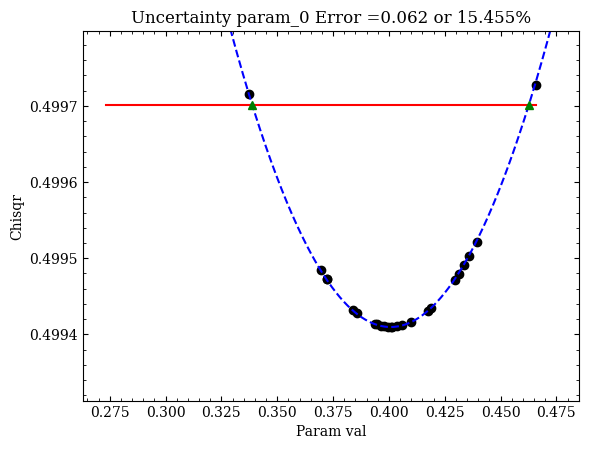

[                                        ]   1/100 (  1%)  99 to go

Evaluating Uncertainty for param_1
Enable show_plots=True and check quality of initial fit.


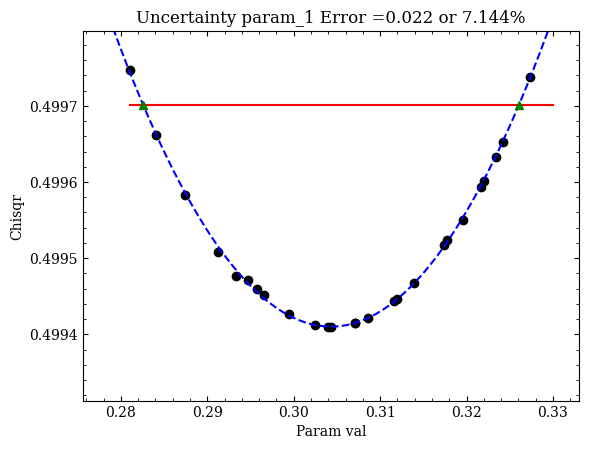

Evaluating Uncertainty for param_2


[                                        ]   2/100 (  2%)  98 to go

Enable show_plots=True and check quality of initial fit.


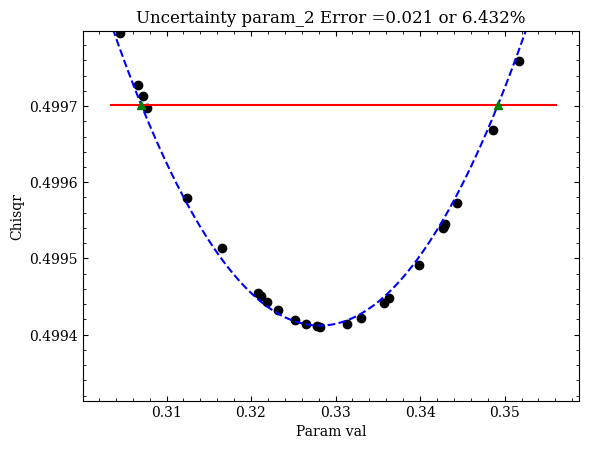

[=                                       ]   3/100 (  3%)  97 to go

Evaluating Uncertainty for param_3
Insufficient number of points under max chisqr. Recursively iterating.
Good points: 19/20
Enable show_plots=True and check quality of initial fit.


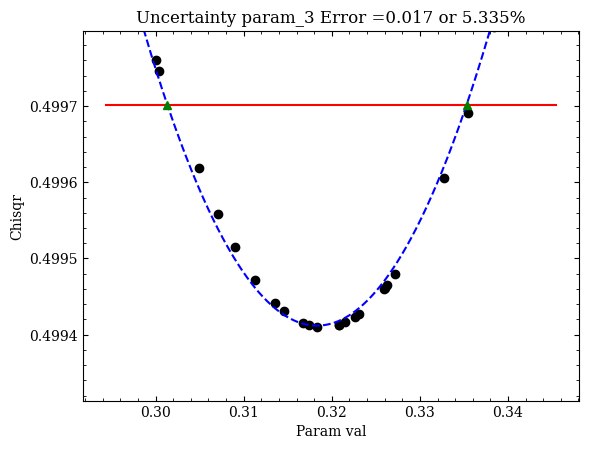

[=                                       ]   4/100 (  4%)  96 to go

Evaluating Uncertainty for param_4
Enable show_plots=True and check quality of initial fit.


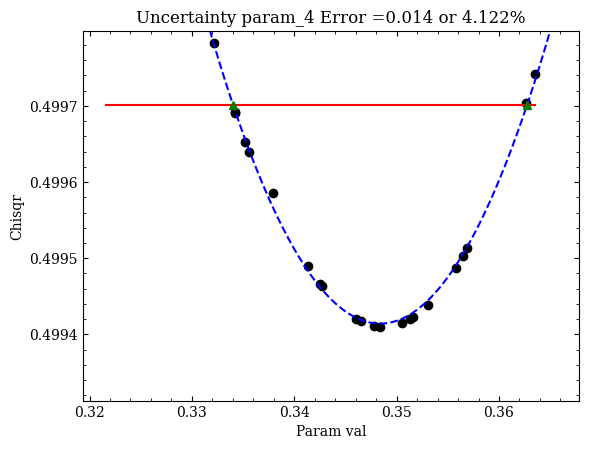

Evaluating Uncertainty for param_5


[==                                      ]   5/100 (  5%)  95 to go

Enable show_plots=True and check quality of initial fit.


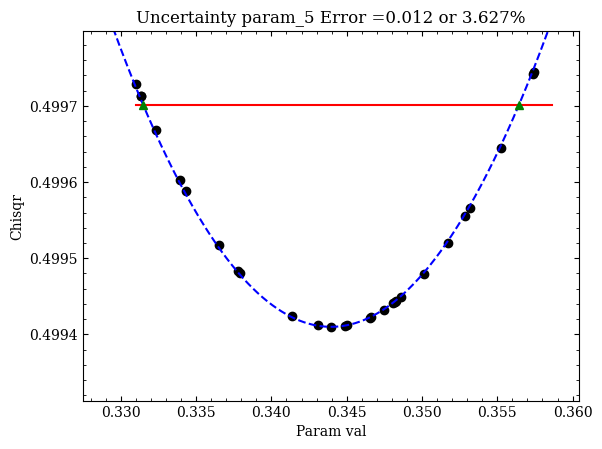

Evaluating Uncertainty for param_6


[==                                      ]   6/100 (  6%)  94 to go

Enable show_plots=True and check quality of initial fit.


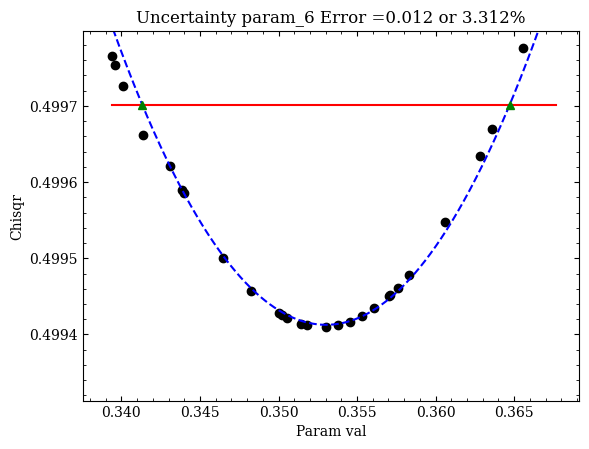

Evaluating Uncertainty for param_7


[==                                      ]   7/100 (  7%)  93 to go

Enable show_plots=True and check quality of initial fit.


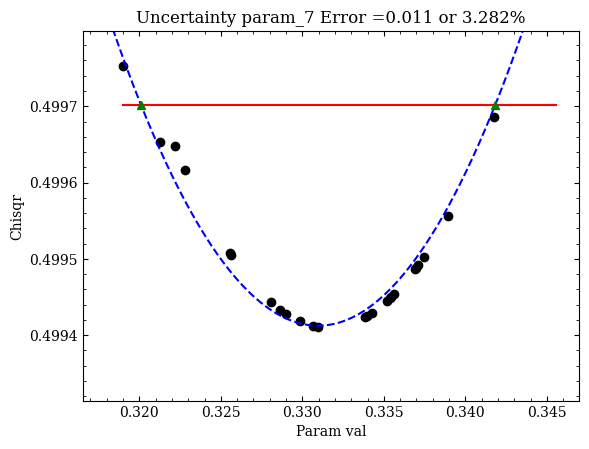

Evaluating Uncertainty for param_8


[===                                     ]   8/100 (  8%)  92 to go

Enable show_plots=True and check quality of initial fit.


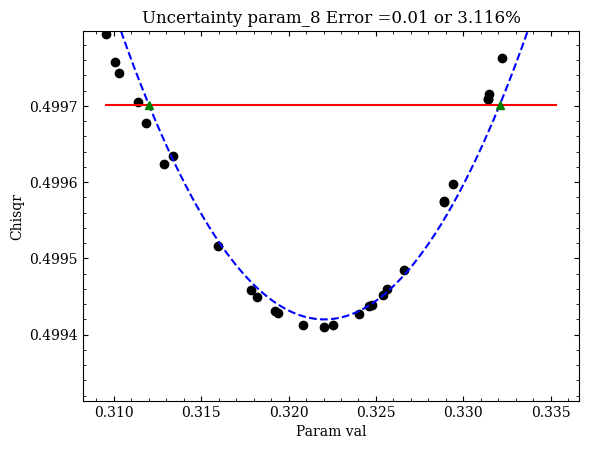

Evaluating Uncertainty for param_9


[===                                     ]   9/100 (  9%)  91 to go

Enable show_plots=True and check quality of initial fit.


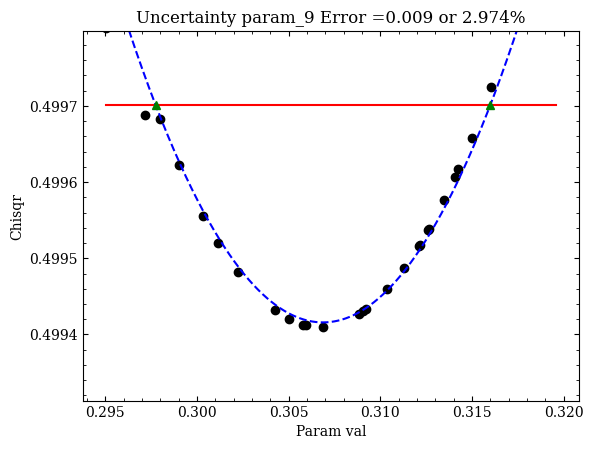

Evaluating Uncertainty for param_10


[====                                    ]  10/100 ( 10%)  90 to go

Enable show_plots=True and check quality of initial fit.


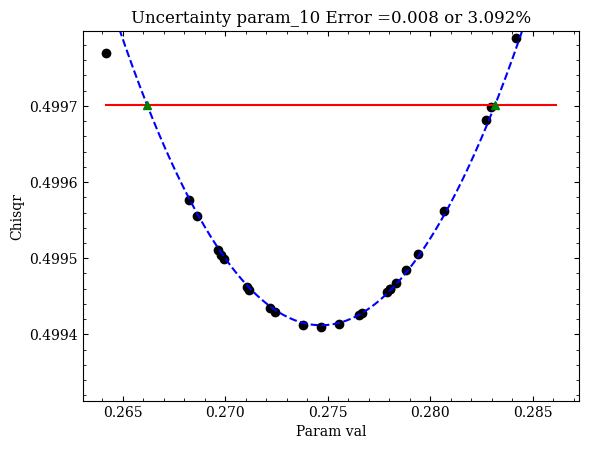

Evaluating Uncertainty for param_11


[====                                    ]  11/100 ( 11%)  89 to go

Enable show_plots=True and check quality of initial fit.


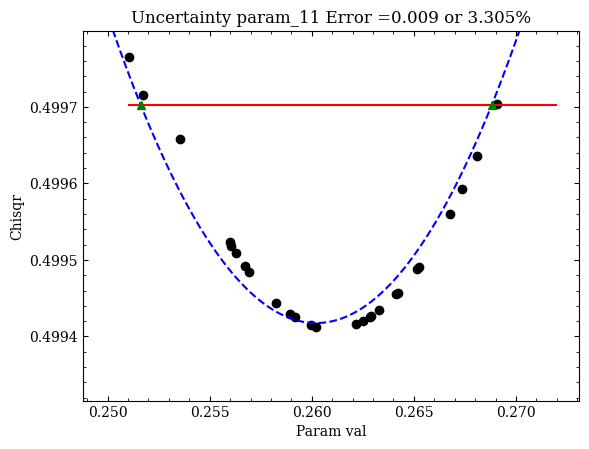

Evaluating Uncertainty for param_12


[====                                    ]  12/100 ( 12%)  88 to go

Enable show_plots=True and check quality of initial fit.


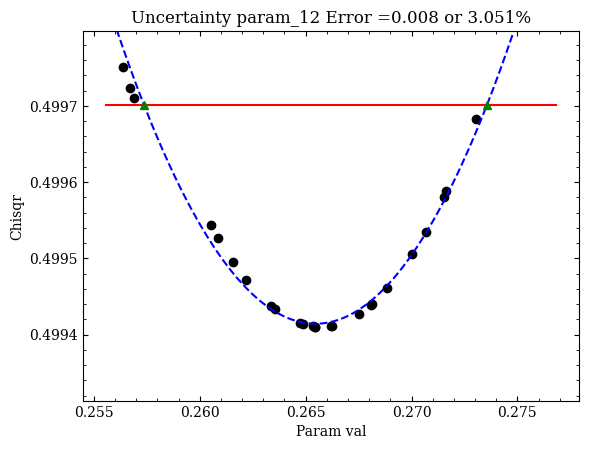

Evaluating Uncertainty for param_13


[=====                                   ]  13/100 ( 13%)  87 to go

Enable show_plots=True and check quality of initial fit.


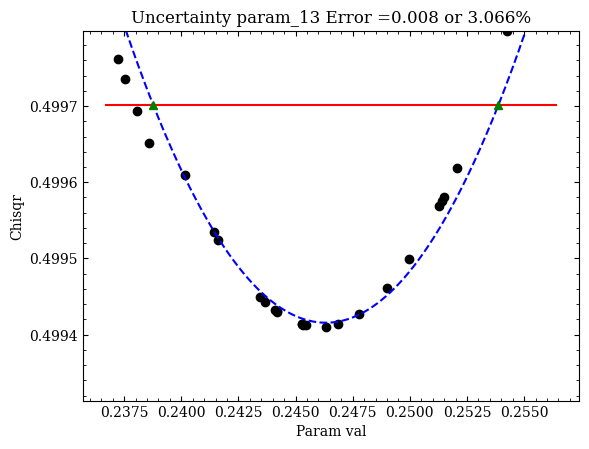

Evaluating Uncertainty for param_14


[=====                                   ]  14/100 ( 14%)  86 to go

Enable show_plots=True and check quality of initial fit.


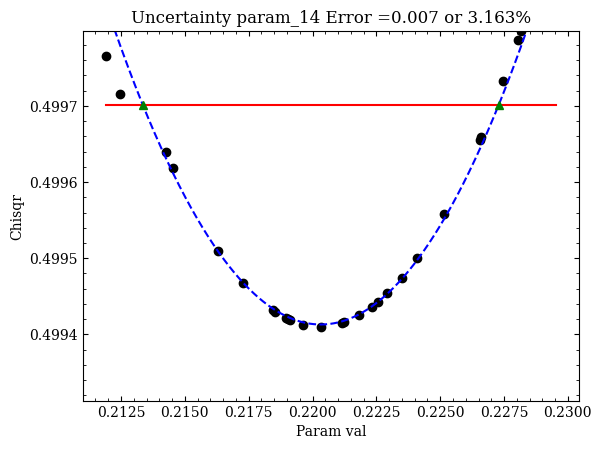

Evaluating Uncertainty for param_15


[======                                  ]  15/100 ( 15%)  85 to go

Enable show_plots=True and check quality of initial fit.


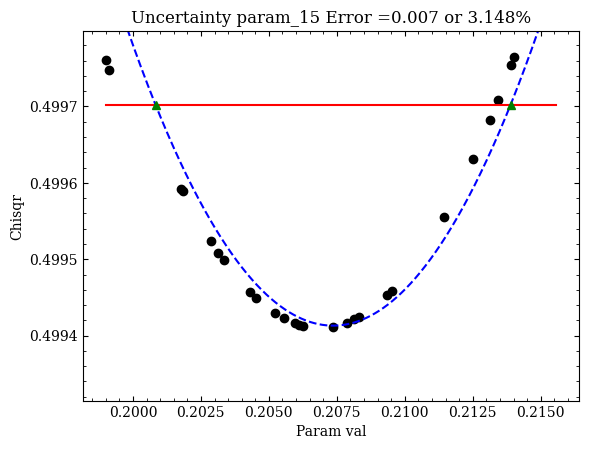

Evaluating Uncertainty for param_16


[======                                  ]  16/100 ( 16%)  84 to go

Enable show_plots=True and check quality of initial fit.


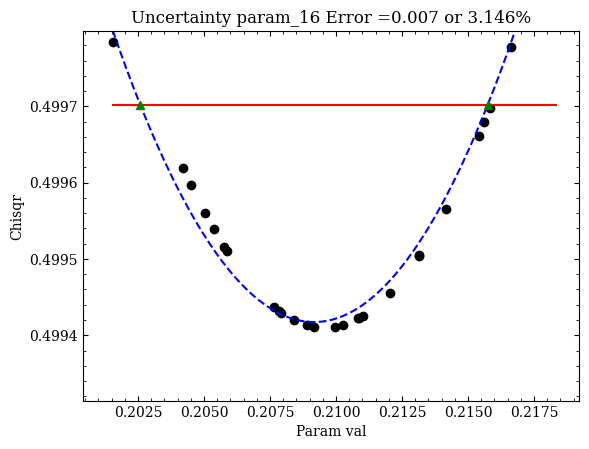

Evaluating Uncertainty for param_17


[======                                  ]  17/100 ( 17%)  83 to go

Enable show_plots=True and check quality of initial fit.


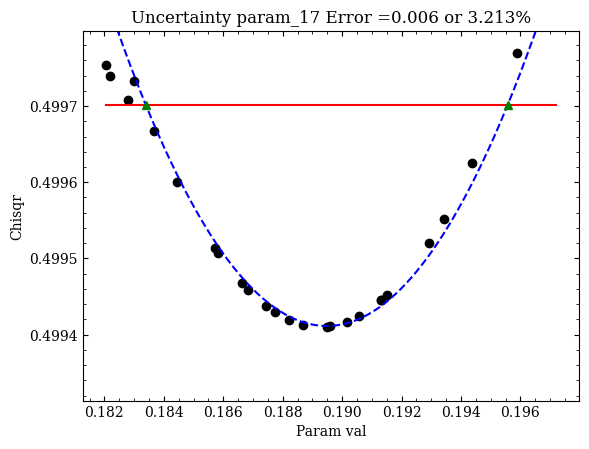

Evaluating Uncertainty for param_18


[=======                                 ]  18/100 ( 18%)  82 to go

Enable show_plots=True and check quality of initial fit.


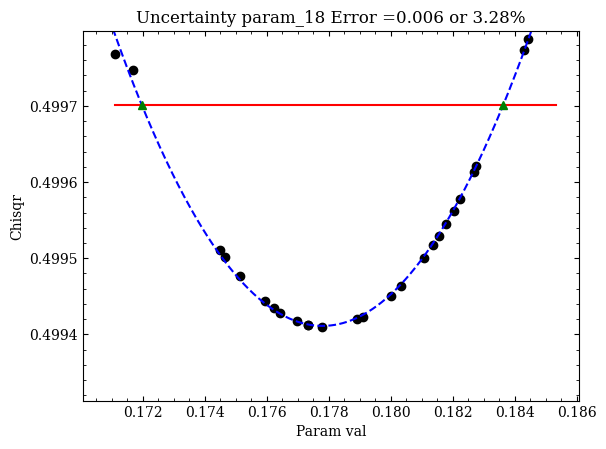

Evaluating Uncertainty for param_19


[=======                                 ]  19/100 ( 19%)  81 to go

Enable show_plots=True and check quality of initial fit.


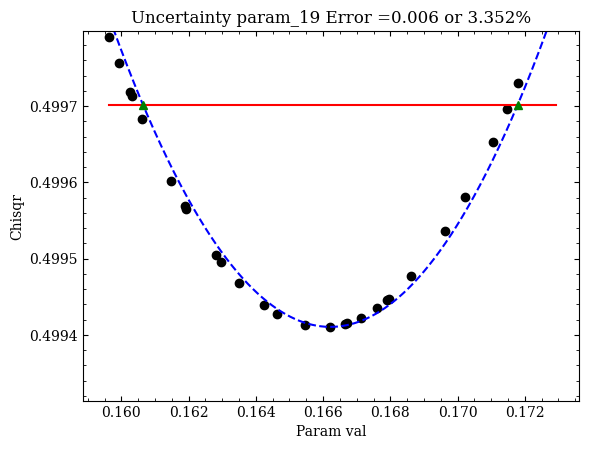

Evaluating Uncertainty for param_20


[========                                ]  20/100 ( 20%)  80 to go

Enable show_plots=True and check quality of initial fit.


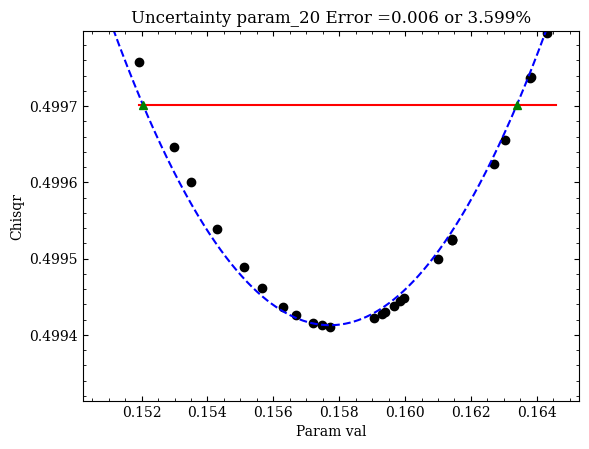

Evaluating Uncertainty for param_21


[========                                ]  21/100 ( 21%)  79 to go

Enable show_plots=True and check quality of initial fit.


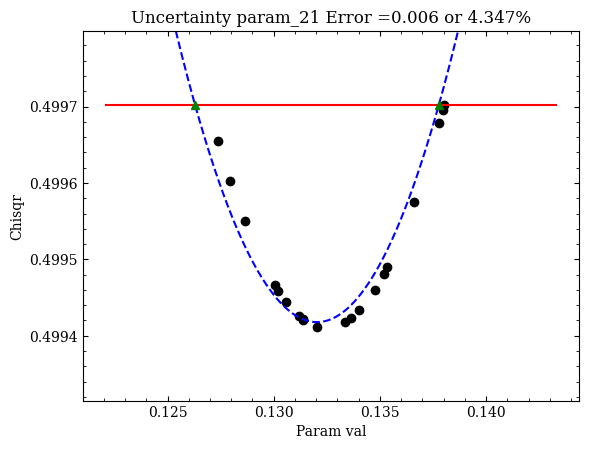

[========                                ]  22/100 ( 22%)  78 to go

Evaluating Uncertainty for param_22
Insufficient number of points under max chisqr. Recursively iterating.
Good points: 19/20
Enable show_plots=True and check quality of initial fit.


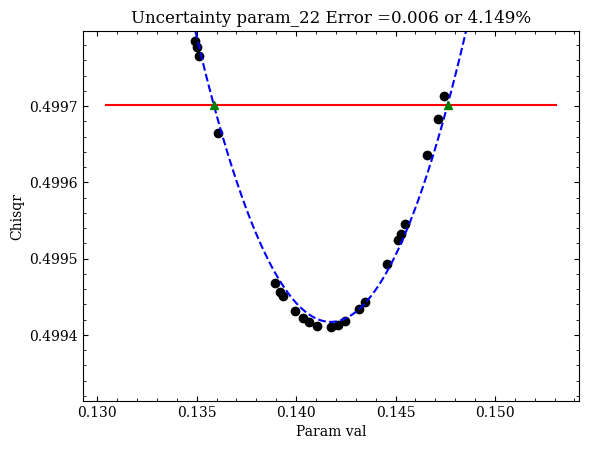

[=========                               ]  23/100 ( 23%)  77 to go

Evaluating Uncertainty for param_23
Enable show_plots=True and check quality of initial fit.


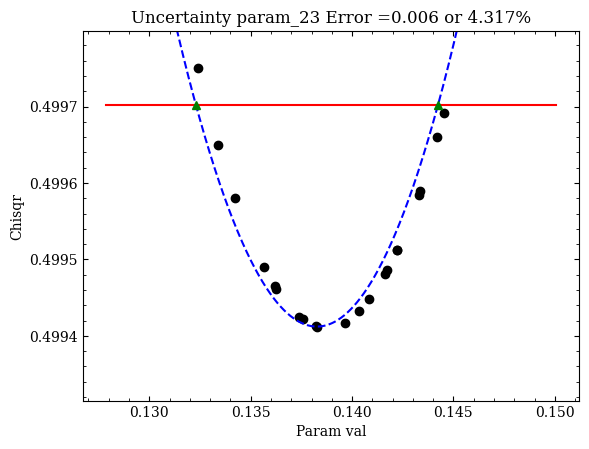

Evaluating Uncertainty for param_24


[=========                               ]  24/100 ( 24%)  76 to go

Enable show_plots=True and check quality of initial fit.


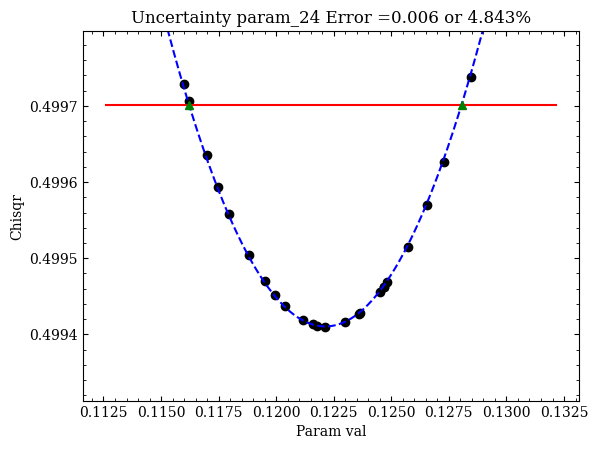

Evaluating Uncertainty for param_25


[==========                              ]  25/100 ( 25%)  75 to go

Enable show_plots=True and check quality of initial fit.


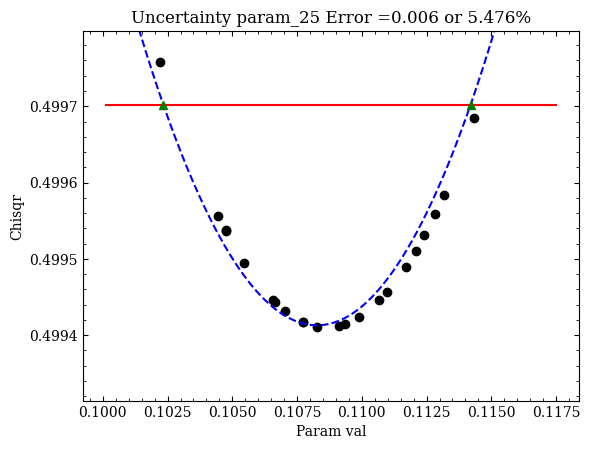

Evaluating Uncertainty for param_26


[==========                              ]  26/100 ( 26%)  74 to go

Enable show_plots=True and check quality of initial fit.


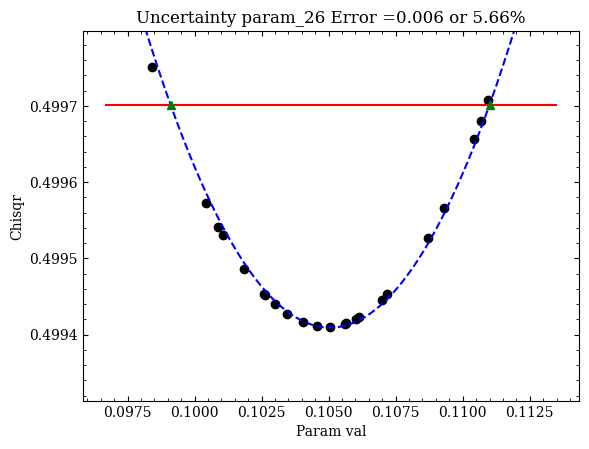

Evaluating Uncertainty for param_27


[==========                              ]  27/100 ( 27%)  73 to go

Enable show_plots=True and check quality of initial fit.


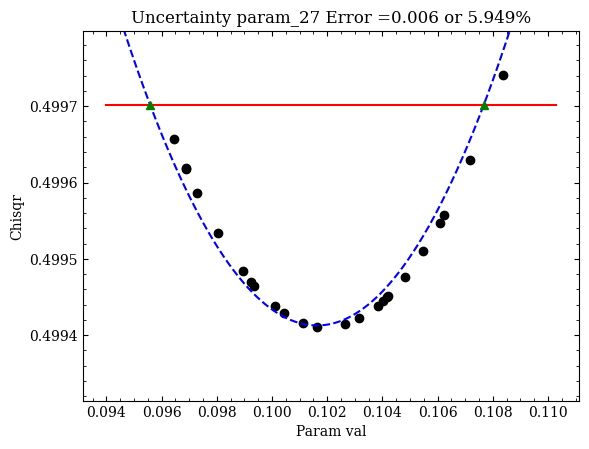

Evaluating Uncertainty for param_28


[===========                             ]  28/100 ( 28%)  72 to go

Enable show_plots=True and check quality of initial fit.


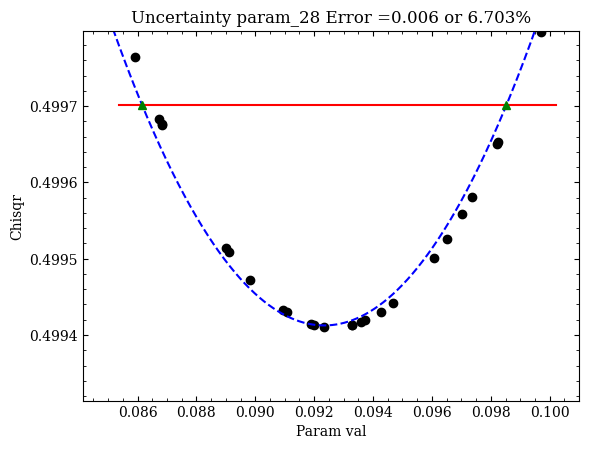

Evaluating Uncertainty for param_29


[===========                             ]  29/100 ( 28%)  71 to go

Enable show_plots=True and check quality of initial fit.


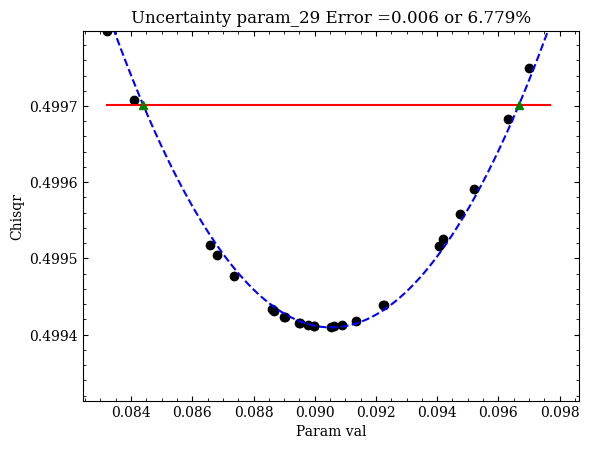

Evaluating Uncertainty for param_30


[============                            ]  30/100 ( 30%)  70 to go

Enable show_plots=True and check quality of initial fit.


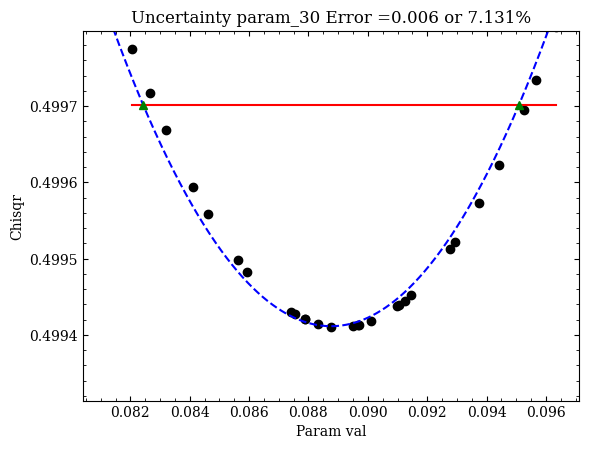

Evaluating Uncertainty for param_31


[============                            ]  31/100 ( 31%)  69 to go

Enable show_plots=True and check quality of initial fit.


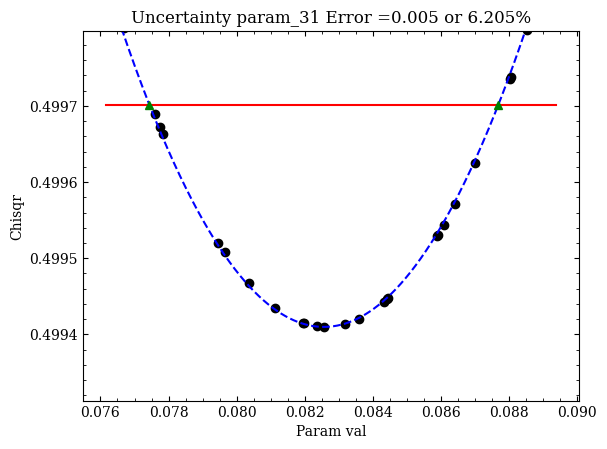

Evaluating Uncertainty for param_32


[============                            ]  32/100 ( 32%)  68 to go

Enable show_plots=True and check quality of initial fit.


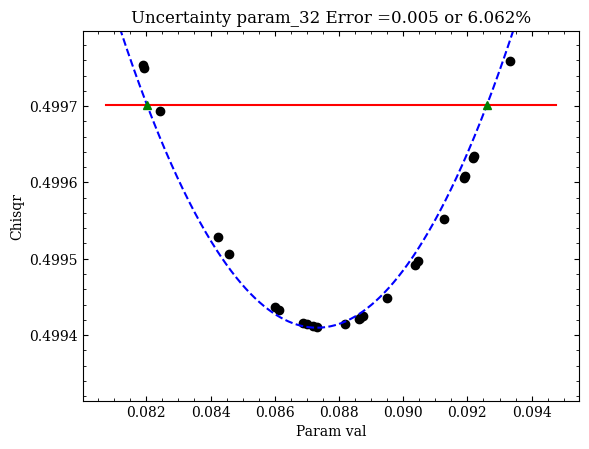

Evaluating Uncertainty for param_33


[=============                           ]  33/100 ( 33%)  67 to go

Enable show_plots=True and check quality of initial fit.


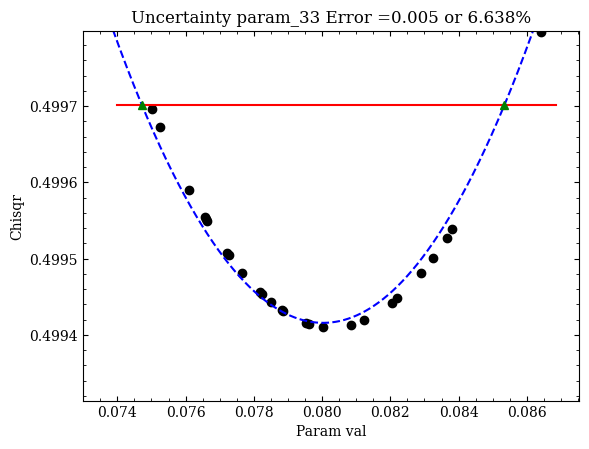

Evaluating Uncertainty for param_34


[=============                           ]  34/100 ( 34%)  66 to go

Enable show_plots=True and check quality of initial fit.


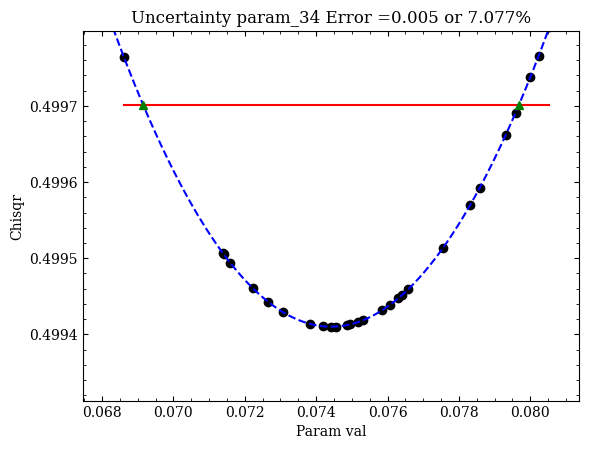

Evaluating Uncertainty for param_35


[==============                          ]  35/100 ( 35%)  65 to go

Enable show_plots=True and check quality of initial fit.


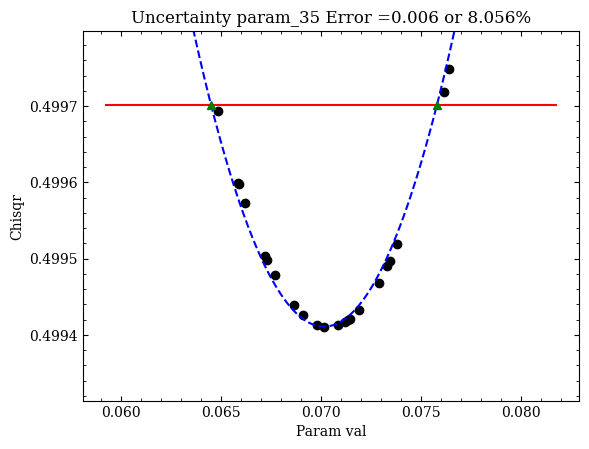

Evaluating Uncertainty for param_36


[==============                          ]  36/100 ( 36%)  64 to go

Enable show_plots=True and check quality of initial fit.


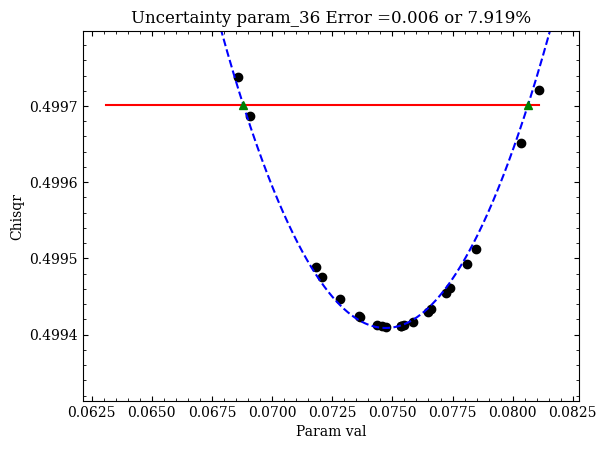

Evaluating Uncertainty for param_37


[==============                          ]  37/100 ( 37%)  63 to go

Enable show_plots=True and check quality of initial fit.


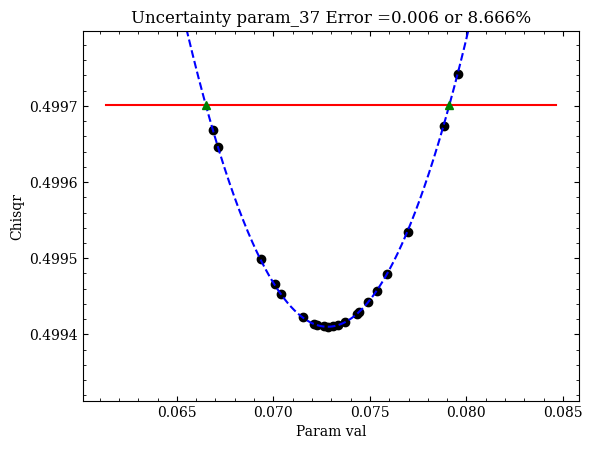

Evaluating Uncertainty for param_38


[===============                         ]  38/100 ( 38%)  62 to go

Insufficient number of points under max chisqr. Recursively iterating.
Good points: 19/20
Enable show_plots=True and check quality of initial fit.


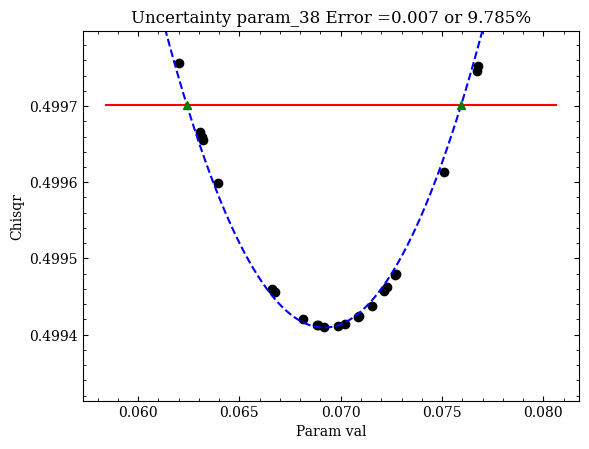

[===============                         ]  39/100 ( 39%)  61 to go

Evaluating Uncertainty for param_39
Insufficient number of points under max chisqr. Recursively iterating.
Good points: 16/20
Enable show_plots=True and check quality of initial fit.


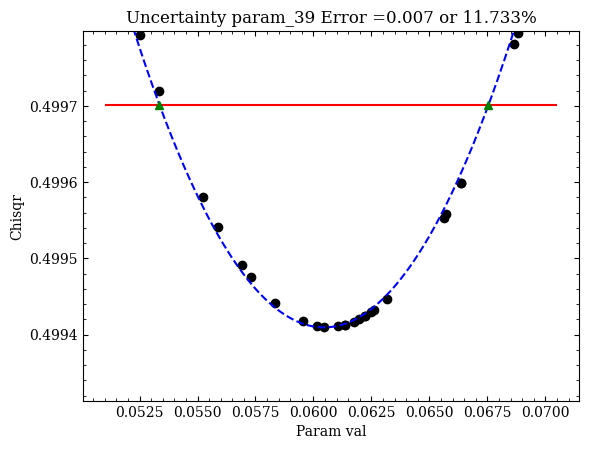

Evaluating Uncertainty for param_40


[================                        ]  40/100 ( 40%)  60 to go

Enable show_plots=True and check quality of initial fit.


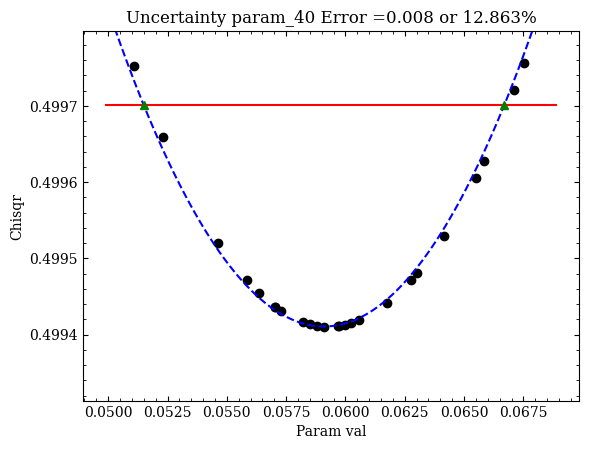

Evaluating Uncertainty for param_41


[================                        ]  41/100 ( 41%)  59 to go

Enable show_plots=True and check quality of initial fit.


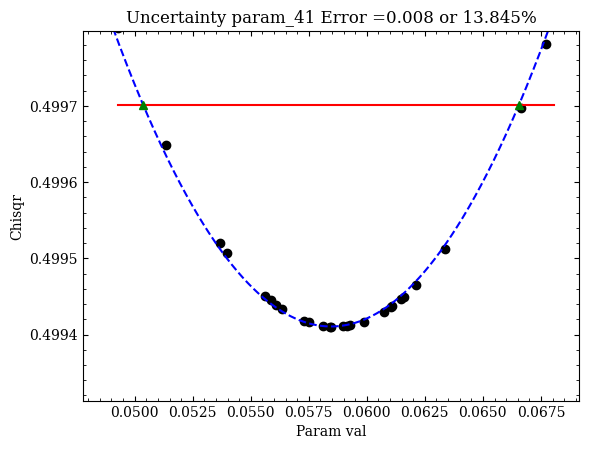

Evaluating Uncertainty for param_42


[================                        ]  42/100 ( 42%)  58 to go

Enable show_plots=True and check quality of initial fit.


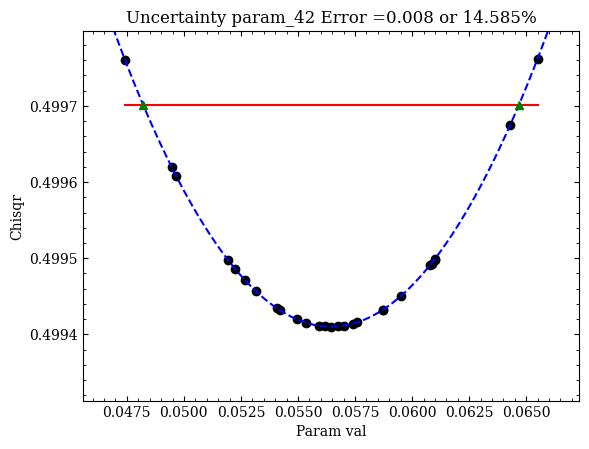

Evaluating Uncertainty for param_43


[=================                       ]  43/100 ( 43%)  57 to go

Insufficient number of points under max chisqr. Recursively iterating.
Good points: 19/20
Enable show_plots=True and check quality of initial fit.


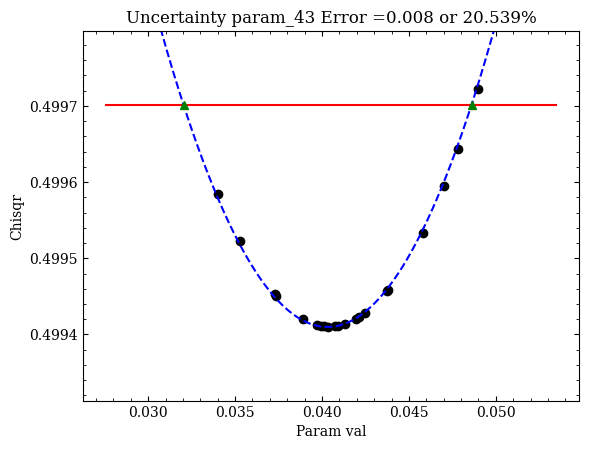

[=================                       ]  44/100 ( 44%)  56 to go

Evaluating Uncertainty for param_44
Enable show_plots=True and check quality of initial fit.


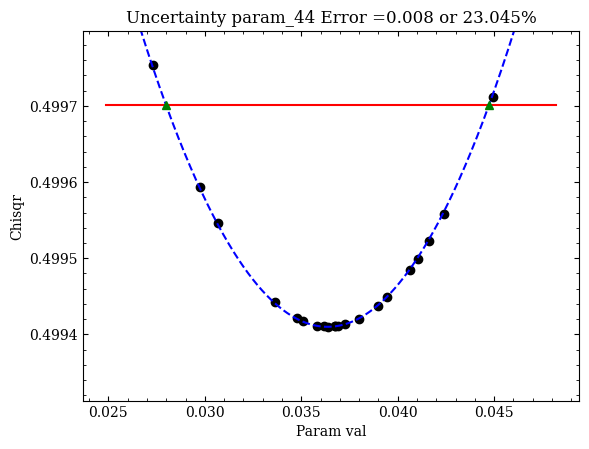

Evaluating Uncertainty for param_45


[==================                      ]  45/100 ( 45%)  55 to go

Enable show_plots=True and check quality of initial fit.


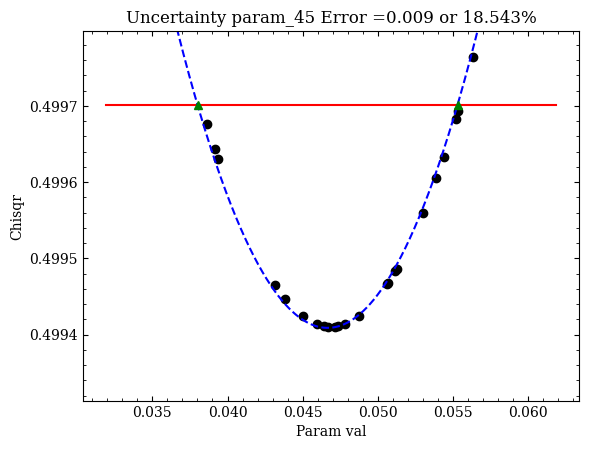

Evaluating Uncertainty for param_46


[==================                      ]  46/100 ( 46%)  54 to go

Enable show_plots=True and check quality of initial fit.


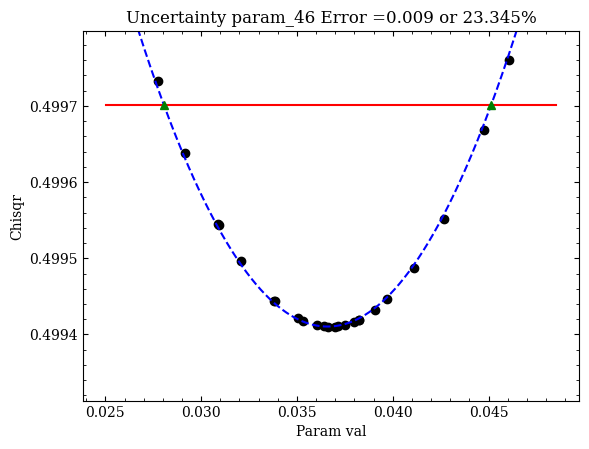

Evaluating Uncertainty for param_47


[==================                      ]  47/100 ( 47%)  53 to go

Enable show_plots=True and check quality of initial fit.


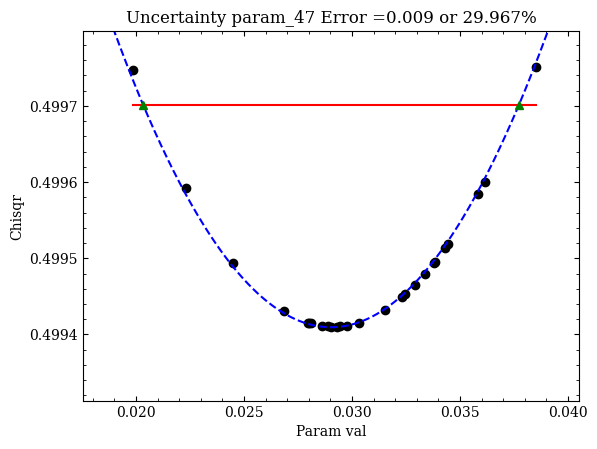

Evaluating Uncertainty for param_48


[===================                     ]  48/100 ( 48%)  52 to go

Insufficient number of points under max chisqr. Recursively iterating.
Good points: 17/20
Enable show_plots=True and check quality of initial fit.


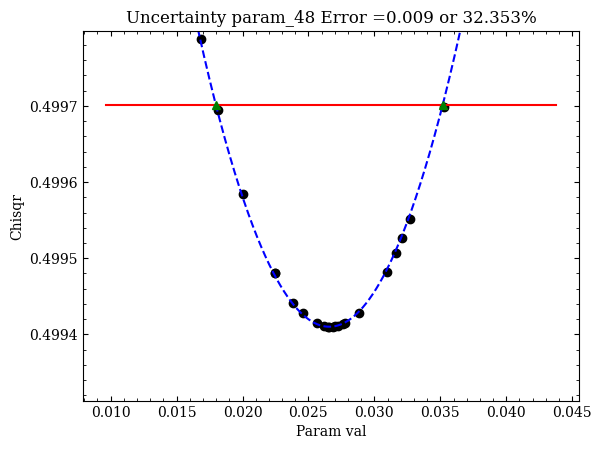

Evaluating Uncertainty for param_49


[===================                     ]  49/100 ( 49%)  51 to go

Insufficient number of points under max chisqr. Recursively iterating.
Good points: 15/20
Enable show_plots=True and check quality of initial fit.


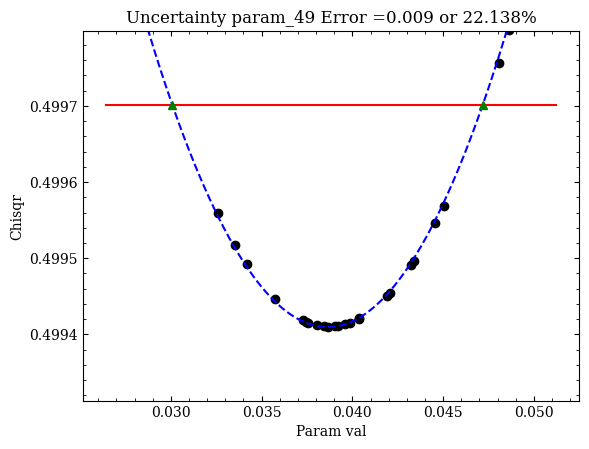

Evaluating Uncertainty for param_50


[====================                    ]  50/100 ( 50%)  50 to go

Insufficient number of points under max chisqr. Recursively iterating.
Good points: 18/20
Enable show_plots=True and check quality of initial fit.


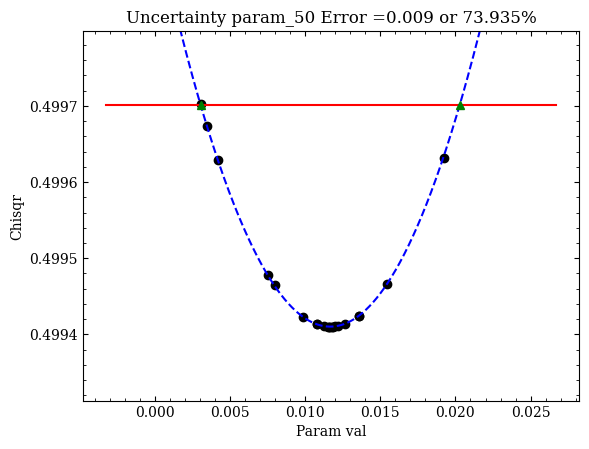

Evaluating Uncertainty for param_51


[====================                    ]  51/100 ( 51%)  49 to go

Enable show_plots=True and check quality of initial fit.


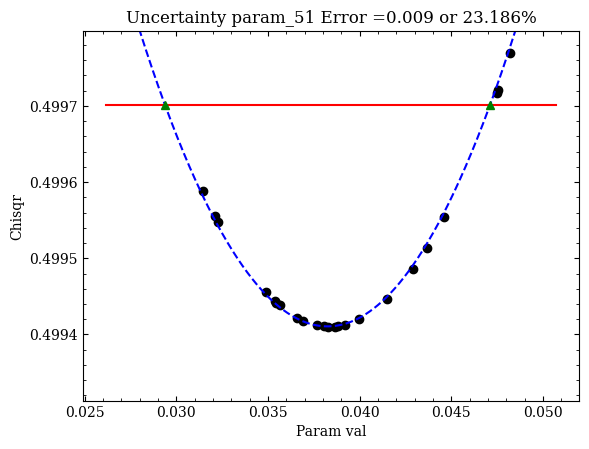

Evaluating Uncertainty for param_52


[====================                    ]  52/100 ( 52%)  48 to go

Enable show_plots=True and check quality of initial fit.


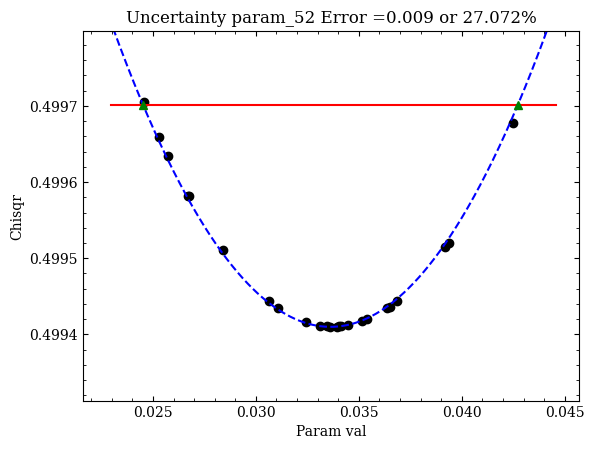

Evaluating Uncertainty for param_53


[=====================                   ]  53/100 ( 53%)  47 to go

Enable show_plots=True and check quality of initial fit.


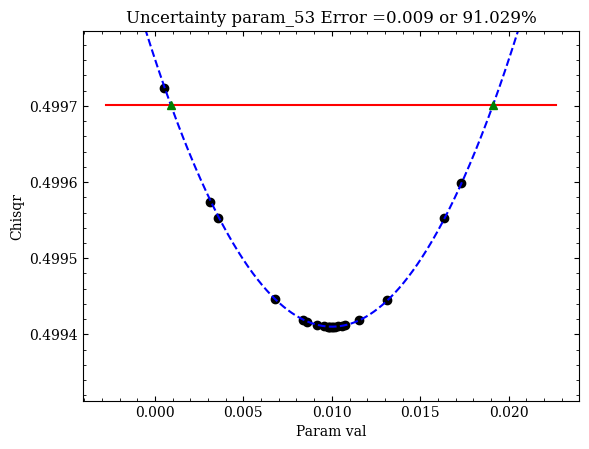

Evaluating Uncertainty for param_55


[=====================                   ]  54/100 ( 54%)  46 to go

Insufficient number of points under max chisqr. Recursively iterating.
Good points: 17/20
Enable show_plots=True and check quality of initial fit.


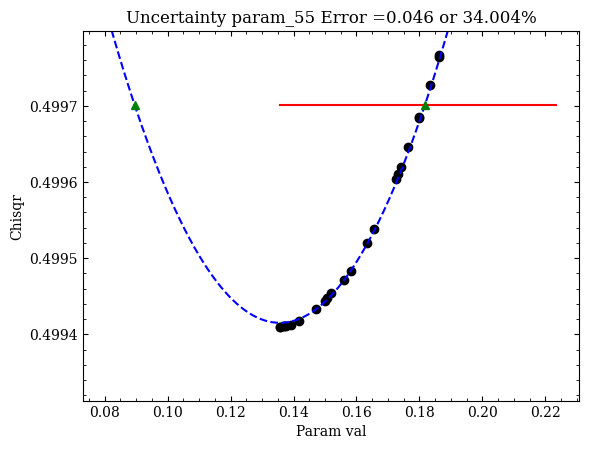

Evaluating Uncertainty for param_56


[======================                  ]  55/100 ( 55%)  45 to go

Enable show_plots=True and check quality of initial fit.


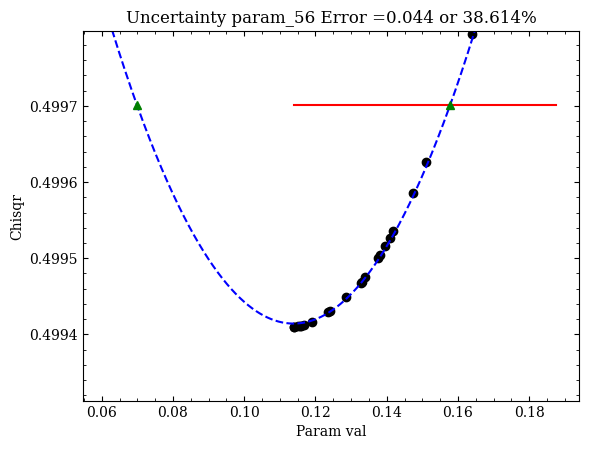

Evaluating Uncertainty for param_57


[======================                  ]  56/100 ( 56%)  44 to go

Insufficient number of points under max chisqr. Recursively iterating.
Good points: 17/20
Enable show_plots=True and check quality of initial fit.


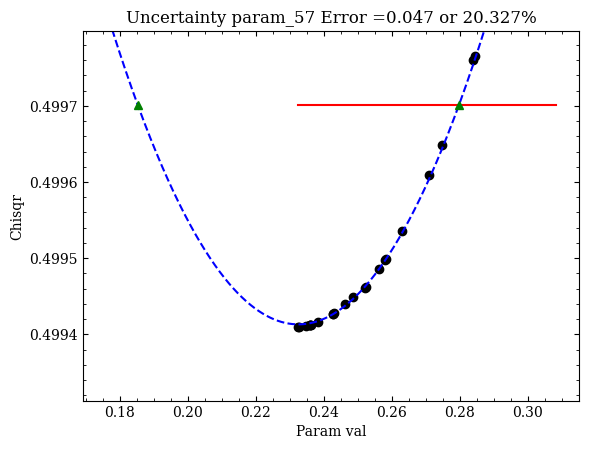

Evaluating Uncertainty for param_58


[======================                  ]  57/100 ( 56%)  43 to go

Enable show_plots=True and check quality of initial fit.


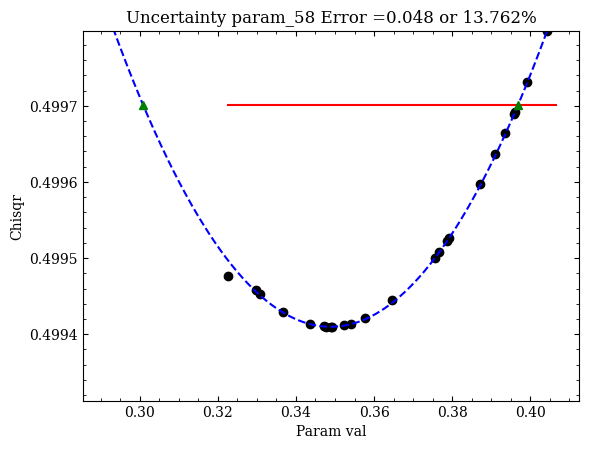

[=======================                 ]  58/100 ( 57%)  42 to go

Evaluating Uncertainty for param_59
Enable show_plots=True and check quality of initial fit.


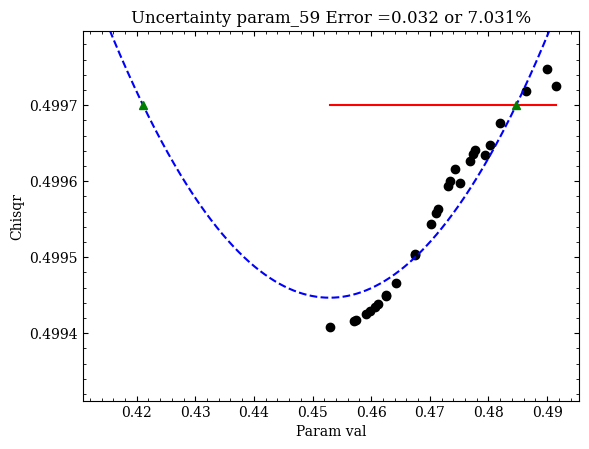

Evaluating Uncertainty for param_60


[=======================                 ]  59/100 ( 59%)  41 to go

Insufficient number of points under max chisqr. Recursively iterating.
Good points: 17/20
Enable show_plots=True and check quality of initial fit.


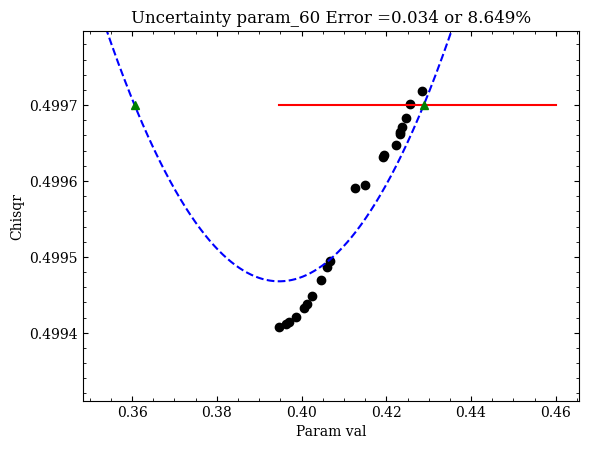

Evaluating Uncertainty for param_61


[========================                ]  60/100 ( 60%)  40 to go

Enable show_plots=True and check quality of initial fit.


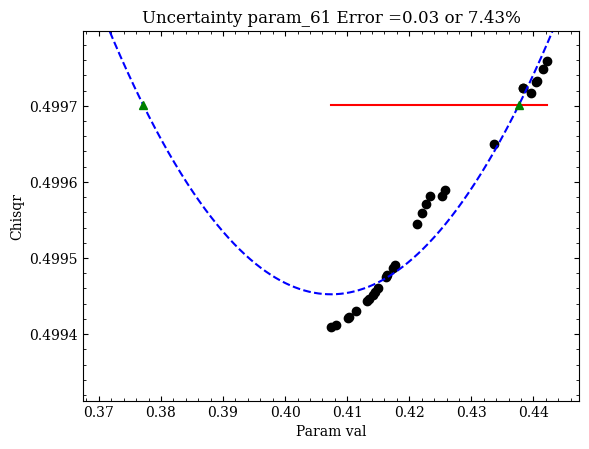

Evaluating Uncertainty for param_62


[========================                ]  61/100 ( 61%)  39 to go

Insufficient number of points under max chisqr. Recursively iterating.
Good points: 18/20


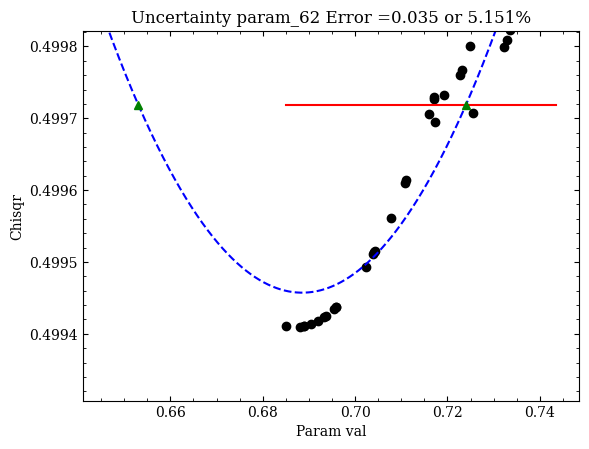

[========================                ]  62/100 ( 62%)  38 to go

Evaluating Uncertainty for param_63


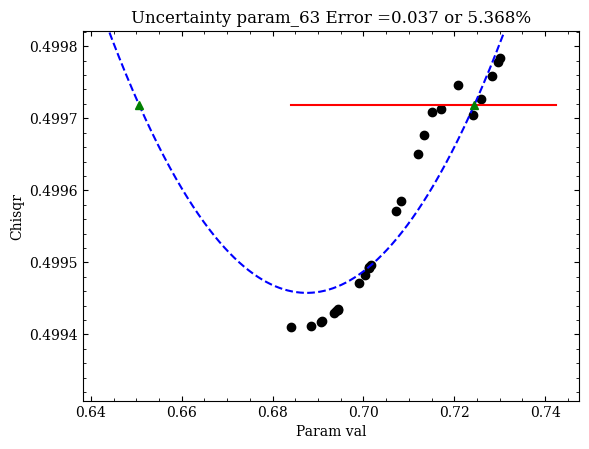

[=========================               ]  63/100 ( 63%)  37 to go

Evaluating Uncertainty for param_64


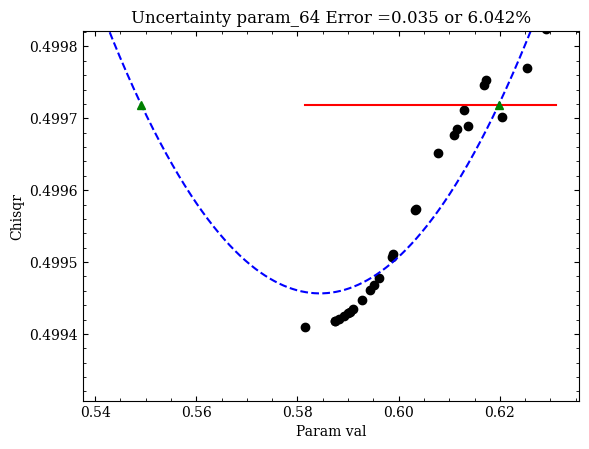

[=========================               ]  64/100 ( 64%)  36 to go

Evaluating Uncertainty for param_65
Insufficient number of points under max chisqr. Recursively iterating.
Good points: 17/20


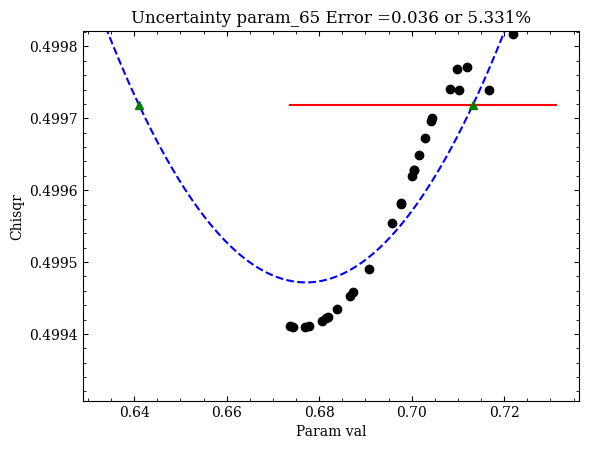

[==========================              ]  65/100 ( 65%)  35 to go

Evaluating Uncertainty for param_66
Insufficient number of points under max chisqr. Recursively iterating.
Good points: 17/20


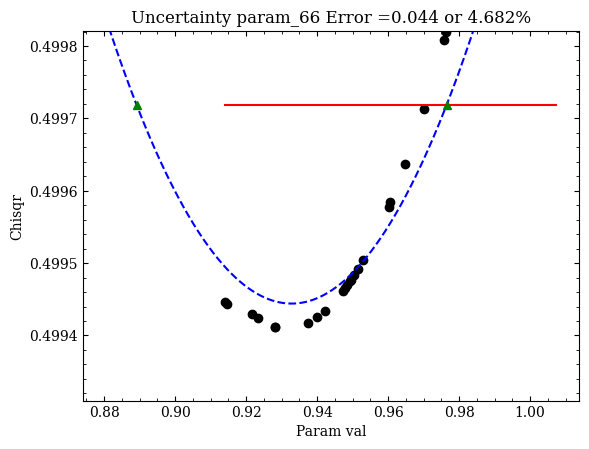

[==========================              ]  66/100 ( 66%)  34 to go

Evaluating Uncertainty for param_67


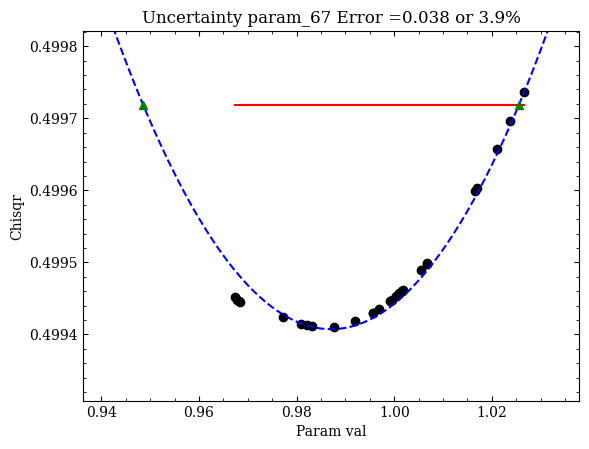

[==========================              ]  67/100 ( 67%)  33 to go

Evaluating Uncertainty for param_68


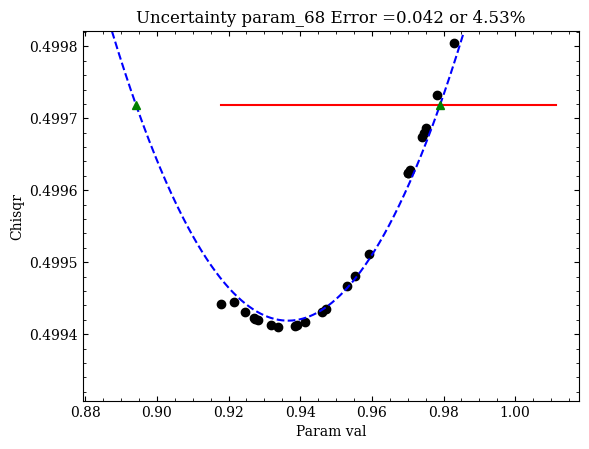

[===========================             ]  68/100 ( 68%)  32 to go

Evaluating Uncertainty for param_69
Insufficient number of points under max chisqr. Recursively iterating.
Good points: 18/20


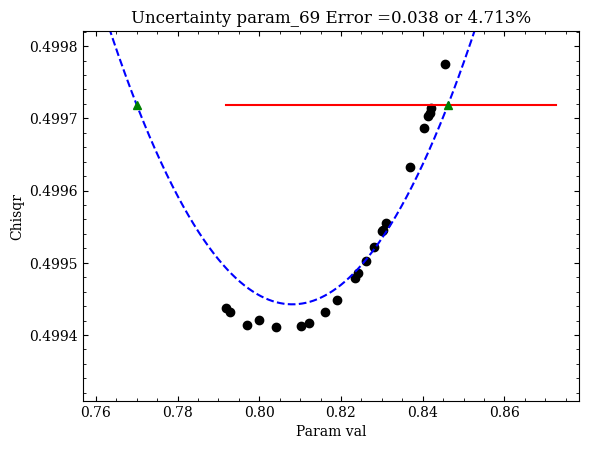

[===========================             ]  69/100 ( 69%)  31 to go

Evaluating Uncertainty for param_70


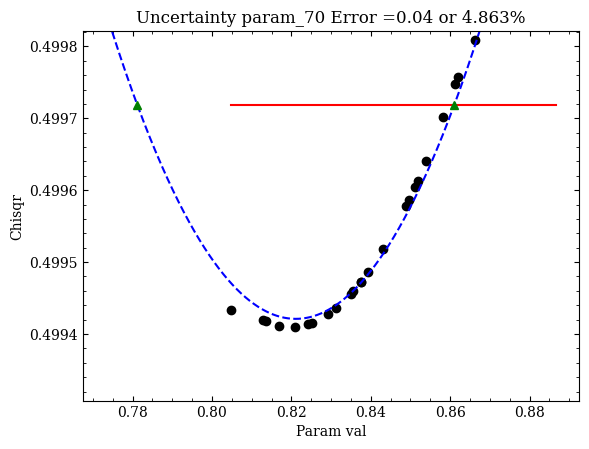

[============================            ]  70/100 ( 70%)  30 to go

Evaluating Uncertainty for param_71


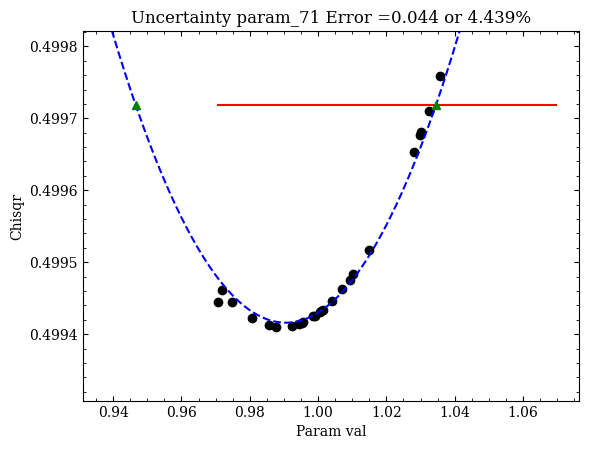

[============================            ]  71/100 ( 71%)  29 to go

Evaluating Uncertainty for param_72
Insufficient number of points under max chisqr. Recursively iterating.
Good points: 16/20


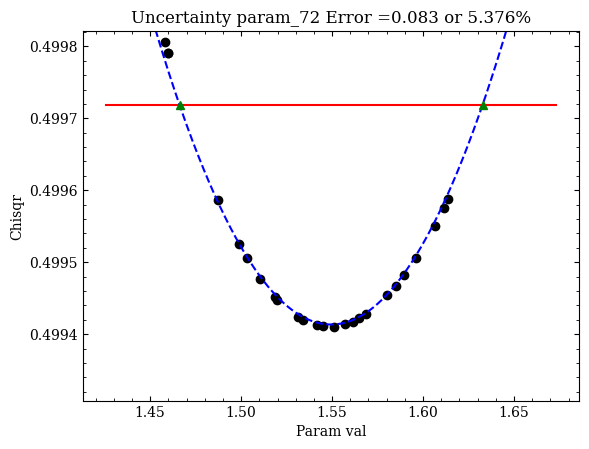

[============================            ]  72/100 ( 72%)  28 to go

Evaluating Uncertainty for param_73


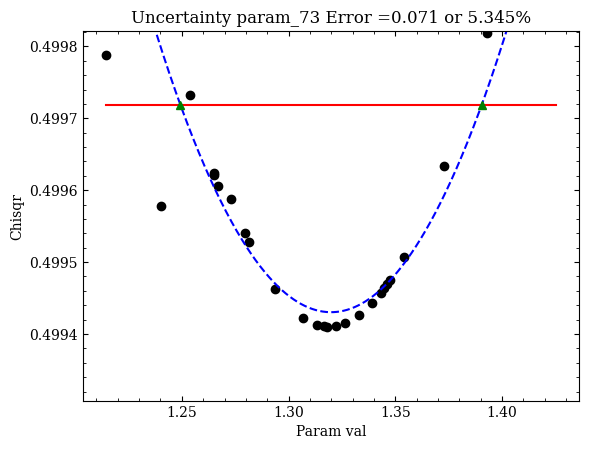

[=============================           ]  73/100 ( 73%)  27 to go

Evaluating Uncertainty for param_74


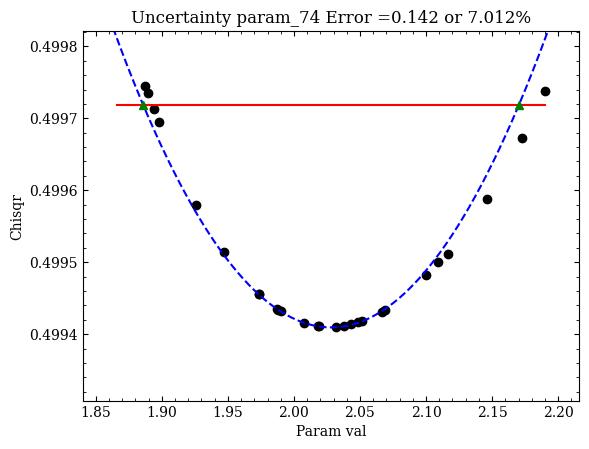

[=============================           ]  74/100 ( 74%)  26 to go

Evaluating Uncertainty for param_75
Insufficient number of points under max chisqr. Recursively iterating.
Good points: 18/20


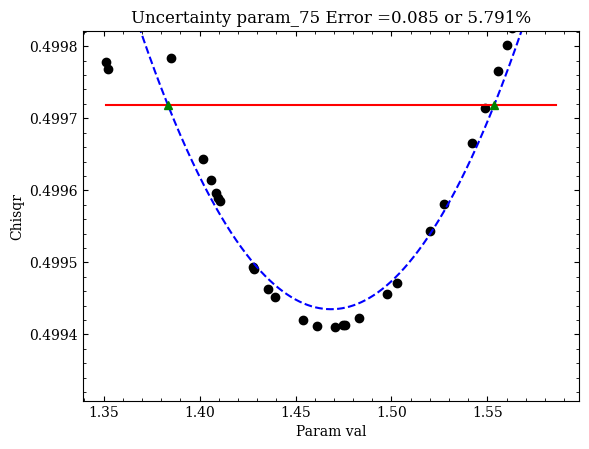

[==============================          ]  75/100 ( 75%)  25 to go

Evaluating Uncertainty for param_76
Insufficient number of points under max chisqr. Recursively iterating.
Good points: 19/20


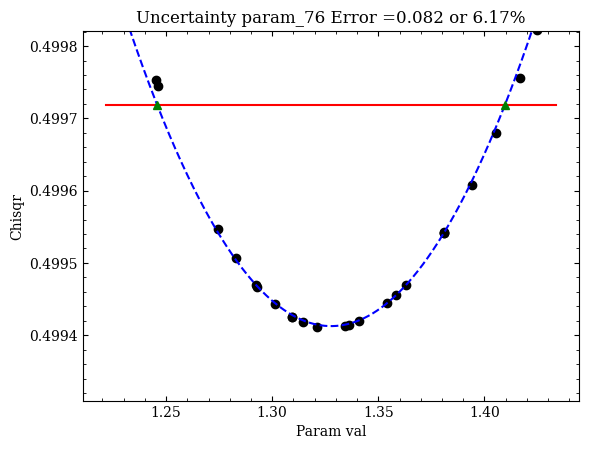

[==============================          ]  76/100 ( 76%)  24 to go

Evaluating Uncertainty for param_77
Insufficient number of points under max chisqr. Recursively iterating.
Good points: 16/20


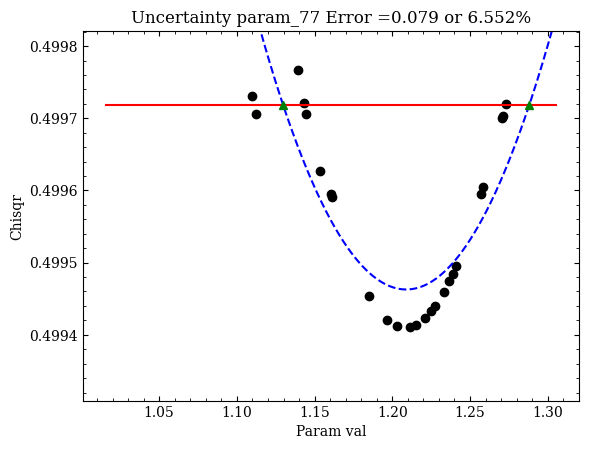

[==============================          ]  77/100 ( 77%)  23 to go

Evaluating Uncertainty for param_78


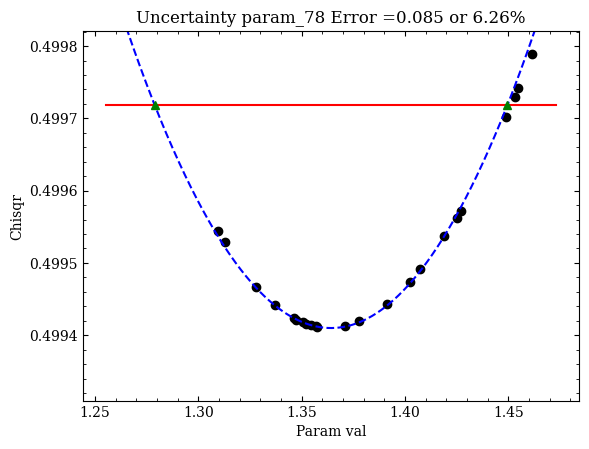

[===============================         ]  78/100 ( 78%)  22 to go

Evaluating Uncertainty for param_79


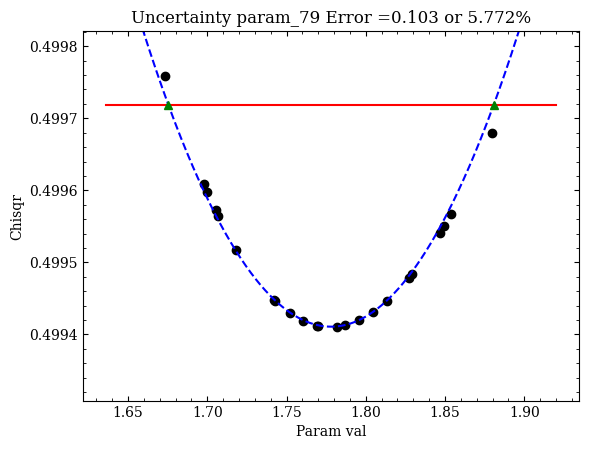

[===============================         ]  79/100 ( 79%)  21 to go

Evaluating Uncertainty for param_80
Insufficient number of points under max chisqr. Recursively iterating.
Good points: 18/20


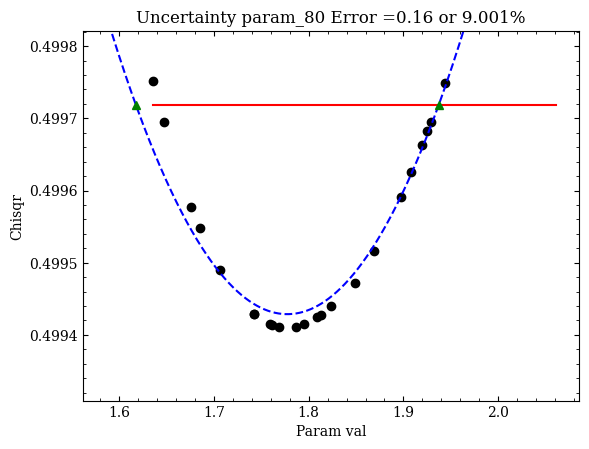

[================================        ]  80/100 ( 80%)  20 to go

Evaluating Uncertainty for param_81


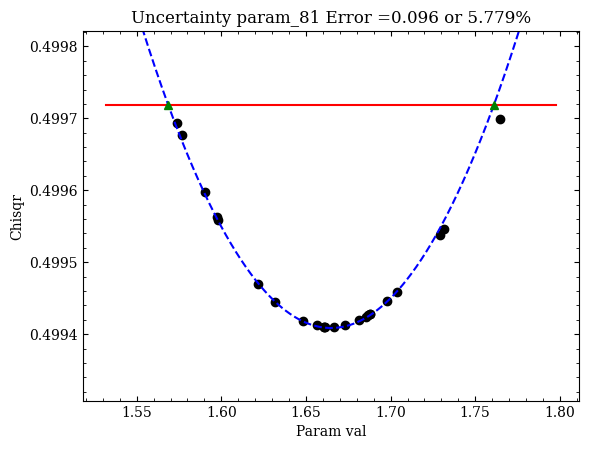

[================================        ]  81/100 ( 81%)  19 to go

Evaluating Uncertainty for param_82
Insufficient number of points under max chisqr. Recursively iterating.
Good points: 19/20


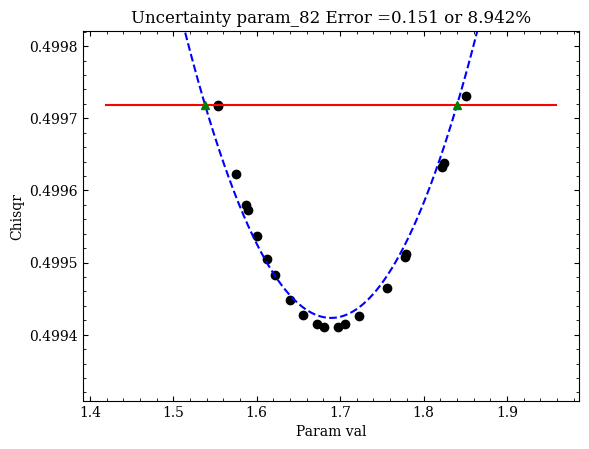

[================================        ]  82/100 ( 82%)  18 to go

Evaluating Uncertainty for param_83
Insufficient number of points under max chisqr. Recursively iterating.
Good points: 17/20


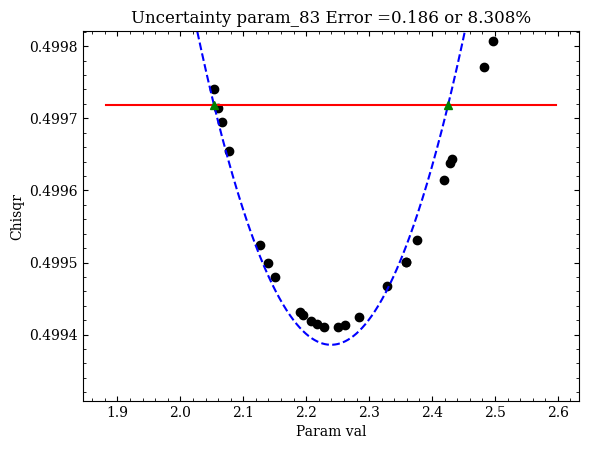

[=================================       ]  83/100 ( 83%)  17 to go

Evaluating Uncertainty for param_84


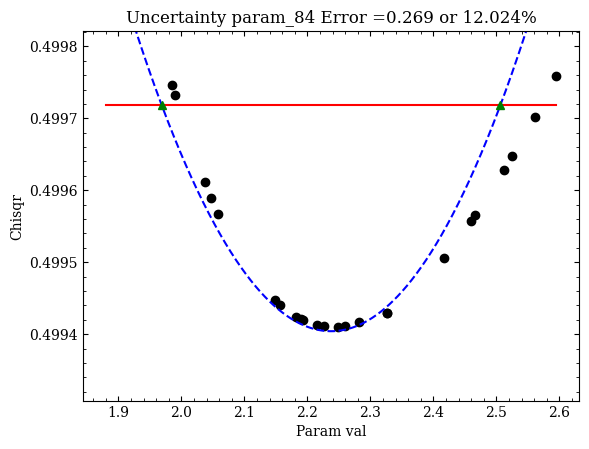

[=================================       ]  84/100 ( 84%)  16 to go

Evaluating Uncertainty for param_85
Insufficient number of points under max chisqr. Recursively iterating.
Good points: 19/20


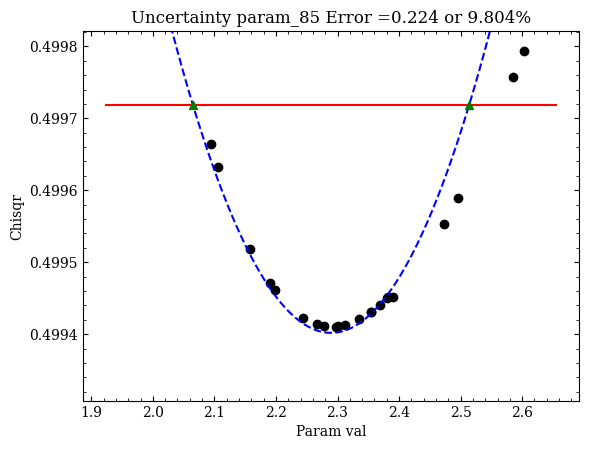

[==================================      ]  85/100 ( 85%)  15 to go

Evaluating Uncertainty for param_86


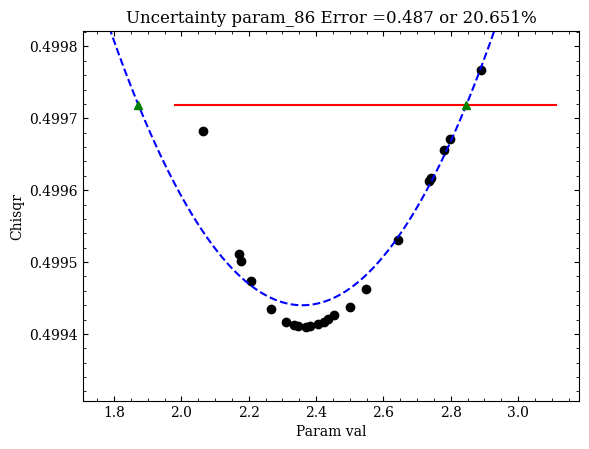

[==================================      ]  86/100 ( 86%)  14 to go

Evaluating Uncertainty for param_87


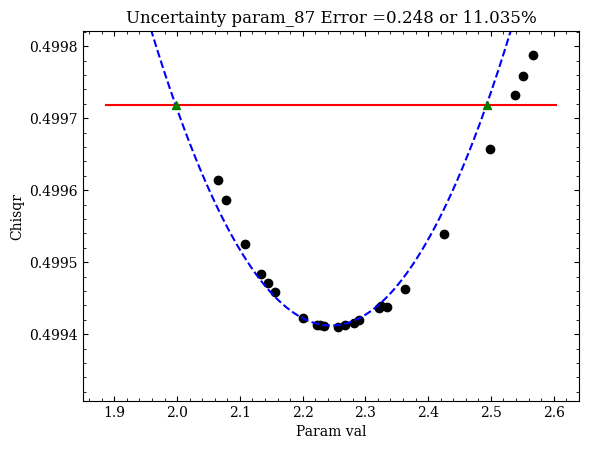

[==================================      ]  87/100 ( 87%)  13 to go

Evaluating Uncertainty for param_88


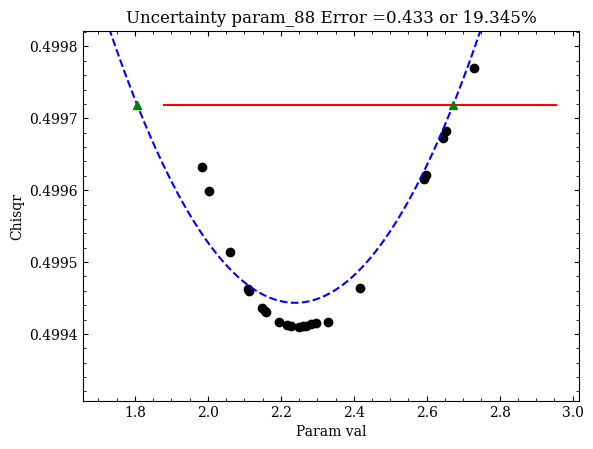

[===================================     ]  88/100 ( 88%)  12 to go

Evaluating Uncertainty for param_89


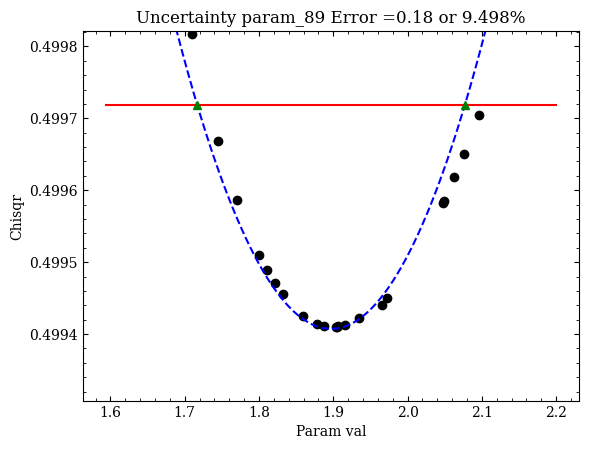

[===================================     ]  89/100 ( 89%)  11 to go

Evaluating Uncertainty for param_90
Insufficient number of points under max chisqr. Recursively iterating.
Good points: 19/20


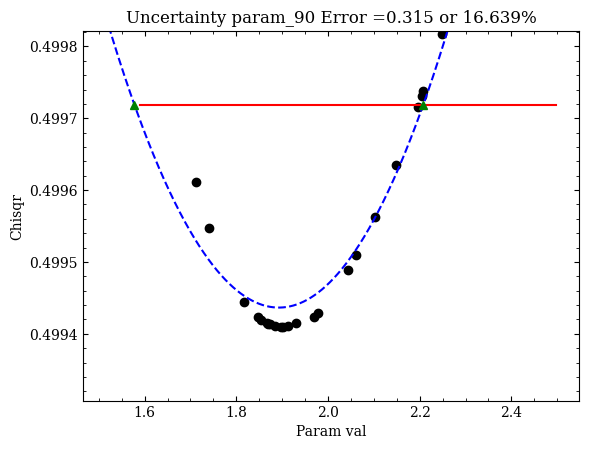

[====================================    ]  90/100 ( 90%)  10 to go

Evaluating Uncertainty for param_91
Insufficient number of points under max chisqr. Recursively iterating.
Good points: 19/20


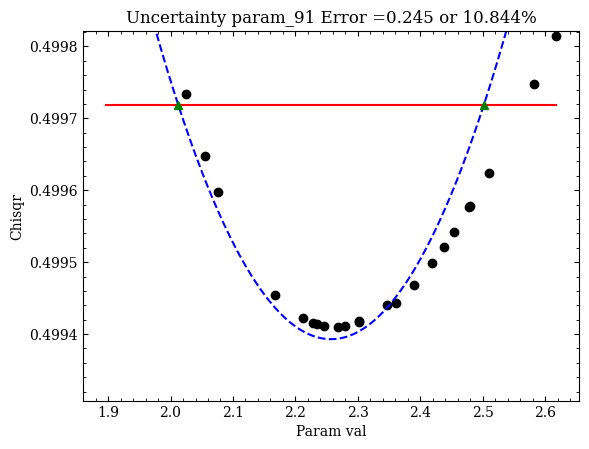

[====================================    ]  91/100 ( 91%)   9 to go

Evaluating Uncertainty for param_92


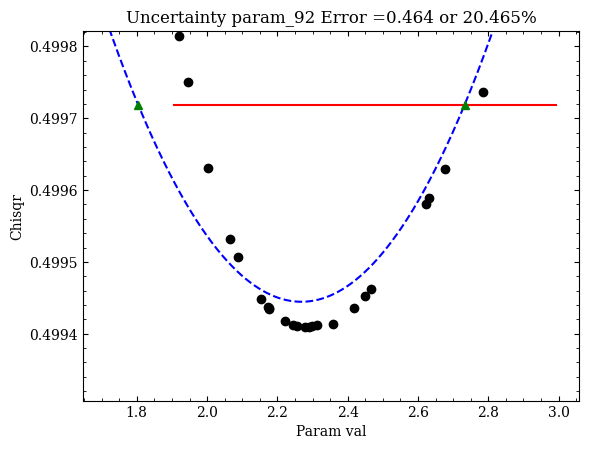

[====================================    ]  92/100 ( 92%)   8 to go

Evaluating Uncertainty for param_93


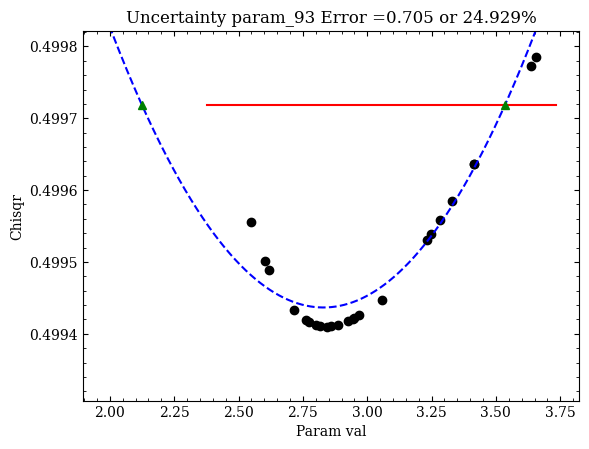

[=====================================   ]  93/100 ( 93%)   7 to go

Evaluating Uncertainty for param_94
Insufficient number of points under max chisqr. Recursively iterating.
Good points: 17/20


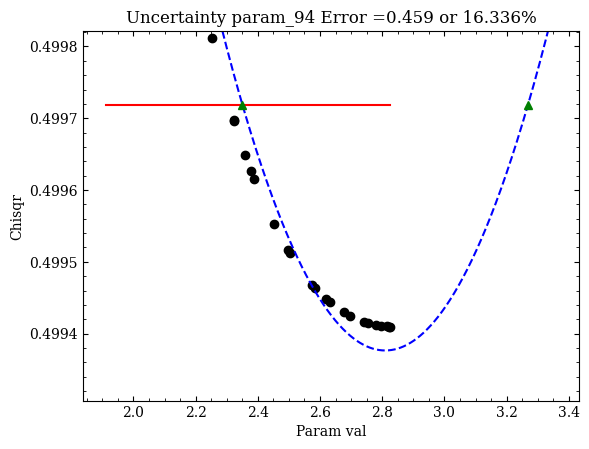

[=====================================   ]  94/100 ( 94%)   6 to go

Evaluating Uncertainty for param_95
Insufficient number of points under max chisqr. Recursively iterating.
Good points: 18/20


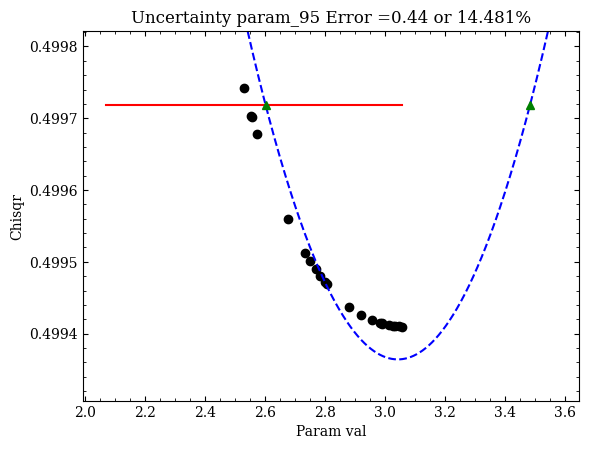

[======================================  ]  95/100 ( 95%)   5 to go

Evaluating Uncertainty for param_96
Insufficient number of points under max chisqr. Recursively iterating.
Good points: 17/20


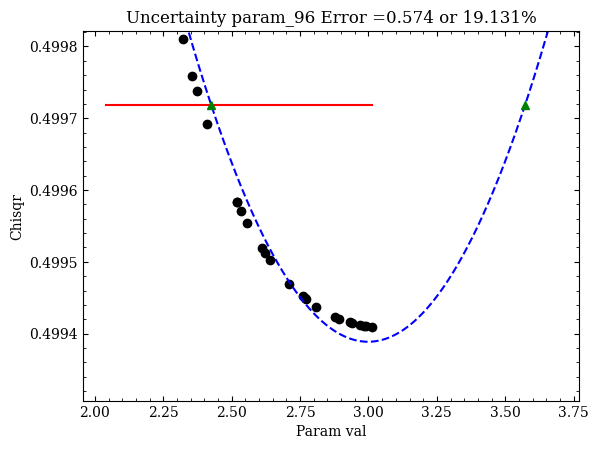

[======================================  ]  96/100 ( 96%)   4 to go

Evaluating Uncertainty for param_97
Insufficient number of points under max chisqr. Recursively iterating.
Good points: 18/20


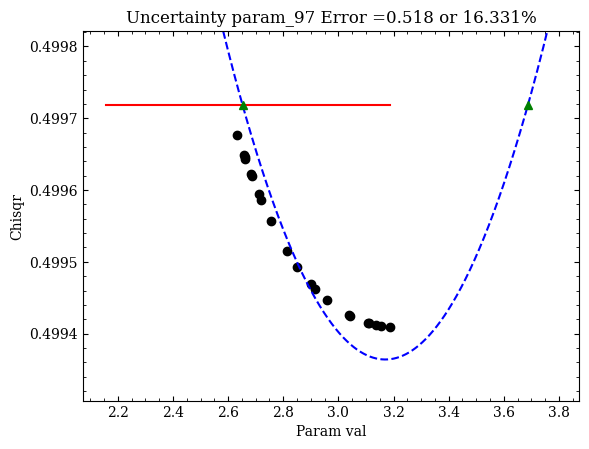

[======================================  ]  97/100 ( 97%)   3 to go

Evaluating Uncertainty for param_98


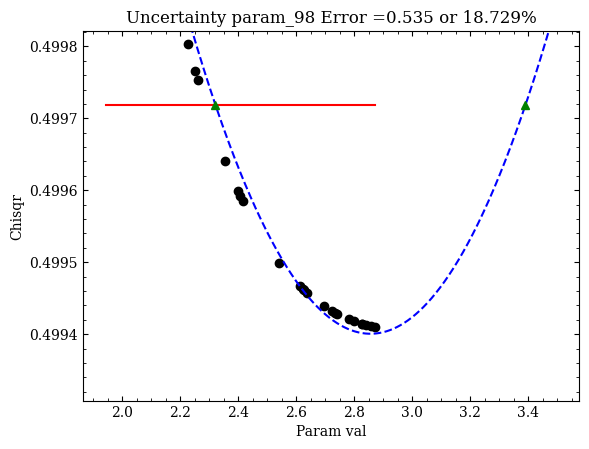

[======================================= ]  98/100 ( 98%)   2 to go

Evaluating Uncertainty for param_99


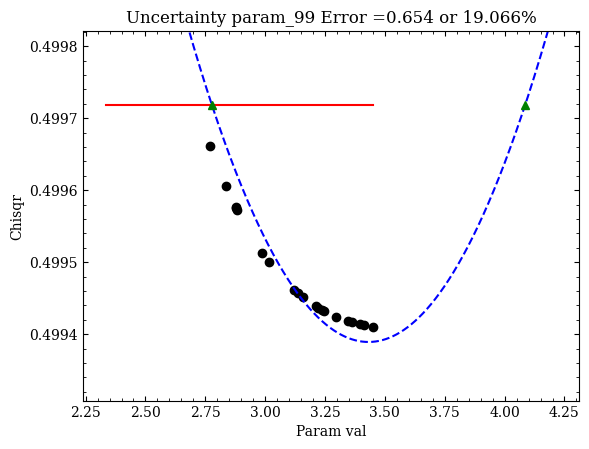

[======================================= ]  99/100 ( 99%)   1 to go

Evaluating Uncertainty for param_100


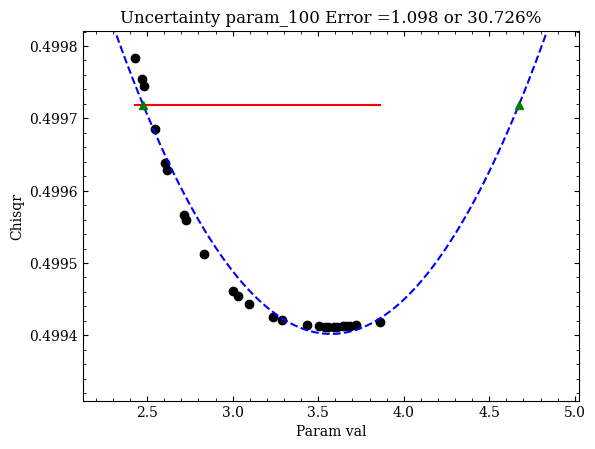

[========================================] 100/100 (100%)   0 to go

CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.03 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds


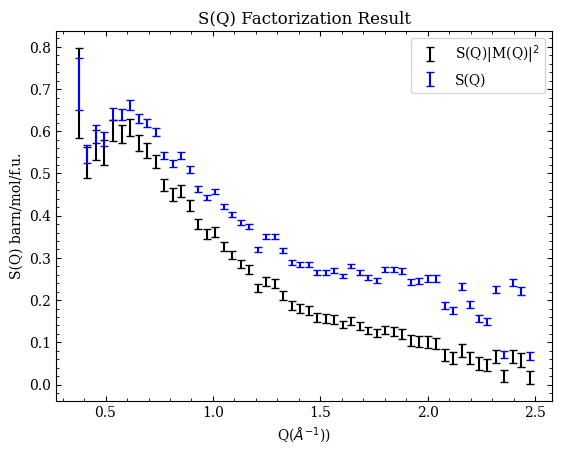

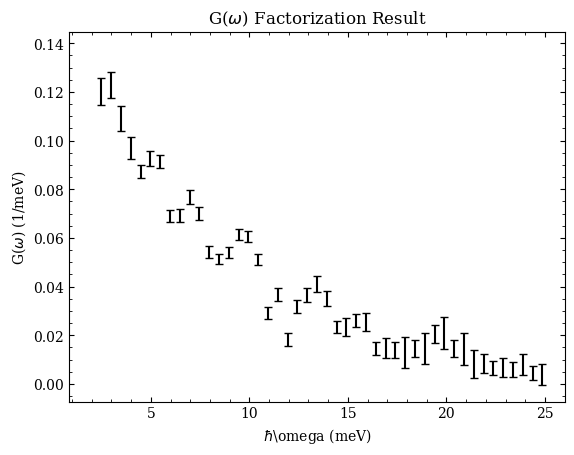

In [16]:
#Factorization 
factor_stitch = stitch_MD.clone()
q_arr,s_q,s_q_err,e_arr,g_e,g_e_err = bnrof.MDfactorizationv2(factor_stitch,'Ru0',Ei=[10.5,25.0,50.0],twoThetaMin=5.0,plot_result=True,
                                             fname='Calculated Uncertainties/bnro_uncertainties.txt',q_lim=[0.35,2.5],e_lim=[1.5,25.0],\
                                             fast_mode=False,overwrite_prev=True,allow_neg_E=False)


Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


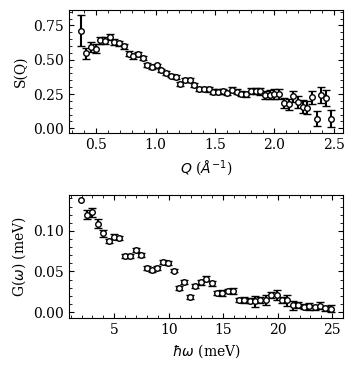

In [22]:
#These are note the final figures, just a check of the calculation above.
fig,ax = plt.subplots(2,1,figsize=(3.54,4))
fig.subplots_adjust(hspace=0.5)
ax[0].errorbar(q_arr,s_q,yerr=s_q_err,color='k',mfc='w',mec='k',ls=' ',capsize=3,marker='o',ms=4)
ax[1].errorbar(e_arr,g_e,yerr=g_e_err,color='k',mfc='w',mec='k',ls=' ',capsize=3,marker='o',ms=4)
ax[1].set_xlabel(r"$\hbar\omega$ (meV)")
ax[0].set_xlabel(r"$Q$ ($\AA^{-1}$)")
ax[0].set_ylabel("S(Q)")
ax[1].set_ylabel(r"G($\omega$) (meV)")
fig.show()

In [45]:
##Change S_q to s_q*M_q
mq = bnrof.get_MANTID_magFF(q_arr,'Ru0')[1]
q,sq_fq, sq_fq_err = q_arr,s_q/mq, s_q_err/mq
#Fix any zero error points in both 
q,sqFq,sqFqErr = np.copy(q_arr),np.copy(sq_fq),np.copy(sq_fq_err)
e,ge,geErr = np.copy(e_arr),np.copy(g_e),np.copy(g_e_err)

g_e_err[g_e_err>1e3]=1e-3
geErr[geErr>np.nanmean(geErr)*10.0]=np.nanmean(geErr)
geErr[geErr<np.nanmean(geErr)/10.0]=np.nanmean(geErr)

low_ge_err_i = np.where(g_e_err<np.nanmean(g_e_err)*0.1)[0]
geErr[low_ge_err_i]=np.nanmean(geErr)

CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.03 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.01 seconds


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.03 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.01 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.01 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF_ion does not match any arguments of the model function. It will be ignored.
The keyword argument dovec does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

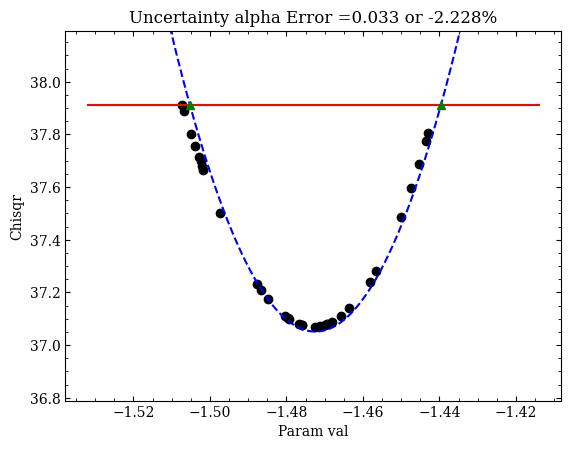

[========================================] 1/1 (100%) 0 to go

In [46]:
#Fitting for trimer based first moment sum rule. 
do= np.array([0.0,0.0,2.54])
d_nn = np.array([5.75,0.0,0.0])
d_nnn = np.array([5.75+5.75*np.cos(60.0*np.pi/180.0),5.75*np.sin(60.0*np.pi/180.0),0.0])
d_2a = np.array([2.0*5.75,0.0,0.0])
a=5.78267
b=5.78267
c=28.77250
gamma = 120.0
ir_d1 = np.array([0.0,0.0,0.5*c])
ir_d2 = np.array([b*1.0/3.0*np.cos(gamma*np.pi/180.0)+a*2.0/3.0,1.0/3.0*b*np.sin(gamma*np.pi/180.0),0.83333*c])
d_out = np.subtract(ir_d2,ir_d1)
d_c = np.array([0.0,0.0,c])
interact_list = [d_nn,d_nnn,d_2a]
#Redo the fits here, allowing for both NN and NNN, and NN outplane 

def linear(Q,m,b):
    Q,FF=bnrof.get_MANTID_magFF(Q,'Ru0')
    FF=1.0/FF
    return m*FF +b*Q**2
def trimer_sq_firstmoment(Q,dvec_ind,A):
    '''
    See BNRO draft appendix for full details. Function takes the following:
    Q- numpy vector of Q points to evalaute 
    A - overall scaling factor
    dvec - numpy vector denoting the particular magnetic interaction displacement vector in Angstrom
    dovec - numpy vector denoting Ru-Ru bond vector
    FF_ion - numpy array of magnetic form factor for the free ion of the same shape as Q
    '''
    Q,FF_ion = bnrof.get_MANTID_magFF(Q,'Ru0')
    FF_ion=1.0/FF_ion
    do= np.array([0.0,0.0,2.54])
    dovec=do
    d_nn = np.array([5.75,0.0,0.0])
    d_nnn = np.array([5.75+5.75*np.cos(60.0*np.pi/180.0),5.75*np.sin(60.0*np.pi/180.0),0.0])
    d_2a = np.array([2.0*5.75,0.0,0.0])
    a=5.78267
    b=5.78267
    c=28.77250
    gamma = 120.0
    ir_d1 = np.array([0.0,0.0,0.5*c])
    ir_d2 = np.array([b*1.0/3.0*np.cos(gamma*np.pi/180.0)+a*2.0/3.0,1.0/3.0*b*np.sin(gamma*np.pi/180.0),0.83333*c])
    d_out = np.subtract(ir_d2,ir_d1)
    d_c = np.array([0.0,0.0,c])
    #Workaround to get the vectors working in lmfit
    if round(dvec_ind)==0:
        dvec=d_nn
    elif round(dvec_ind)==1:
        dvec=d_nnn
    elif round(dvec_ind)==2:
        dvec=d_2a
    elif round(dvec_ind)==3:
        dvec=d_out
    elif round(dvec_ind)==4:
        dvec=d_c
    else:
        print("ERROR invalid dvec ind")
        print(int(dvec_ind))
        return np.nan
    d0 = np.linalg.norm(dovec)
    d = np.linalg.norm(dvec)
    A1 = FF_ion /9.0
    B = 3.0+2.0*np.sin(2.0*Q*d0)/(2.0*Q*d0)+4.0*np.sin(Q*d0)/(Q*d0)
    C = 3.0*np.sin(Q*d)/(Q*d) + \
        np.sin(Q*np.linalg.norm(np.subtract(2.0*dovec,dvec)))/(Q*np.linalg.norm(np.subtract(2.0*dovec,dvec)))+\
        np.sin(Q*np.linalg.norm(np.add(2.0*dovec,dvec)))/(Q*np.linalg.norm(np.add(2.0*dovec,dvec)))+\
        2.0*np.sin(Q*np.linalg.norm(np.subtract(dovec,dvec)))/(Q*np.linalg.norm(np.subtract(dovec,dvec)))+\
        2.0*np.sin(Q*np.linalg.norm(np.add(dovec,dvec)))/(Q*np.linalg.norm(np.add(dovec,dvec)))
    s_q = A*A1*(B - C)
    return s_q

#New lmfit model with analytic form
sqT_model = Model(trimer_sq_firstmoment,prefix='NN_',independent_vars=['Q'])+\
            Model(trimer_sq_firstmoment,prefix='NNN_',independent_vars=['Q'])+\
            Model(trimer_sq_firstmoment,prefix='NN2a_',independent_vars=['Q'])+\
            Model(trimer_sq_firstmoment,prefix='NN_out_',independent_vars=['Q'])
sqT_params=sqT_model.make_params()
sqT_params.add('NN_A',vary=True,value=0.0,min=-5,max=5)
sqT_params.add('NN_dvec_ind',value=0,vary=False)
sqT_params.add('NNN_A',vary=True,value=0.0,min=-5,max=5)
sqT_params.add('NNN_dvec_ind',value=1,vary=False)
sqT_params.add('NN2a_A',vary=False,value=0.00,min=-5,max=5)
sqT_params.add('NN2a_dvec_ind',value=2,vary=False)
sqT_params.add('NN_out_A',vary=False,value=0.00,min=-5,max=5)
sqT_params.add('NN_out_dvec_ind',value=3,vary=False)
q,ff = bnrof.get_MANTID_magFF(q,'Ru0')
ff=1.0/ff

weightsT = 1.0/np.array(sqFqErr)
weightsT[q>1.0]=0.0
weightsT[q<0.0]=0.0
fit_errT = np.copy(sqFqErr)
fit_errT[q>1.0]=1e30
fit_errT[q<0.0]=1e30
sq_resultT = sqT_model.fit(sqFq,Q=q,FF_ion=ff,dovec=do,params=sqT_params,weights=weightsT,method='powell',\
                          nan_policy='omit')

#Repeat for Ru3+ form 
def sq_model(Q,FF,A,d):
    out=A*FF*(1.0-np.sin(Q*d)/(Q*d))
    return out
model = lmfit.Model(sq_model,prefix='d1_',independent_vars=['Q','FF'])+lmfit.Model(sq_model,prefix='d2_',independent_vars=['Q','FF'])+lmfit.Model(sq_model,prefix='d3_',independent_vars=['Q','FF'])
params=model.make_params()
params.add('d1_A',vary=True,value=1.0,min=-100,max=100)
params.add('d1_d',vary=False,value=5.75,min=0,max=100)
params.add('d2_A',vary=True,value=0.0,min=-100,max=100)
params.add('d2_d',vary=False,value=9.95,min=0,max=100)
params.add('d3_A',vary=False,value=0.0,min=-100,max=100)
params.add('d3_d',vary=False,value=np.linalg.norm(d_out),min=0,max=100)
result_ru=model.fit(sqFq,Q=q,params=params,FF=ff,weights =weightsT,method='powell')

#Also fit ge to a power law. 
def gemodel(e,alpha,A):
    return A*np.power(e,alpha)

gemodel = Model(gemodel)
geparams = gemodel.make_params()
geparams.add('A',vary=False,value=1.0,min=0.0,max=100.0)
geparams.add('alpha',value=-0.13,min=-5,max=1)
geresult = gemodel.fit(ge,e=e,params=geparams,weights=1.0/geErr,nan_policy='omit',method='powell')
print(geresult.fit_report())
gefit_param_errs = bnrof.calculate_param_uncertainty(ge,geErr,gemodel,geparams,geresult,independent_vars={'e':e},\
                                                       extrapolate=True,show_plots=True,fname='Calculated Uncertainties/ge_test_Ru.txt',\
                                                     overwrite_prev=True,fast_calc=False)


The keyword argument FF does not match any arguments of the model function. It will be ignored.


Evaluating Uncertainty for NN_A
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.03 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagF

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.
The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
Crea

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
Crea

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Not

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
Crea

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
Crea

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

The keyword argument FF does not match any arguments of the model function. It will be ignored.
The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
Crea

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
Crea

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.01 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Not

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
Crea

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Not

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
Crea

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
Crea

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
Crea

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
Crea

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
Crea

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
Crea

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

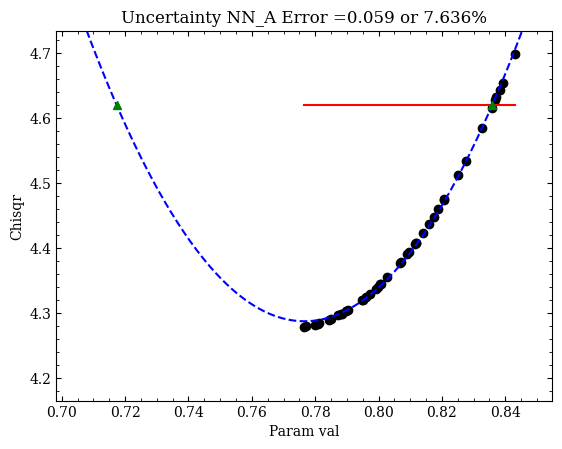

[====================                    ] 1/2 ( 50%) 1 to goThe keyword argument FF does not match any arguments of the model function. It will be ignored.


Evaluating Uncertainty for NNN_A
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.03 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
Crea

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.03 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
Crea

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Not

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
Crea

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.01 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Not

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
Crea

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Not

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Not

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
Crea

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Not

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Not

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
Crea

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Not

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
Crea

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
Crea

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

The keyword argument FF does not match any arguments of the model function. It will be ignored.


CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.01 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrect

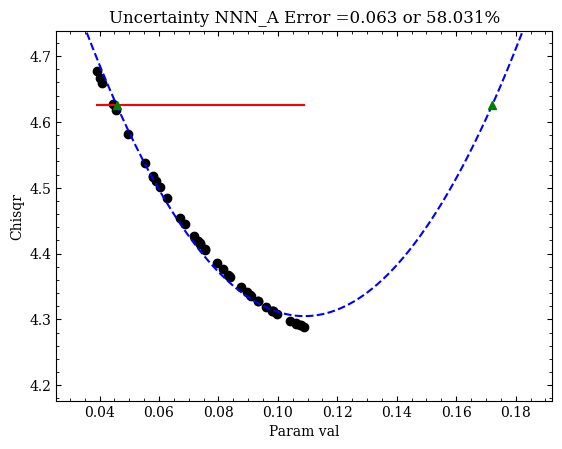

[========================================] 2/2 (100%) 0 to go

Evaluating Uncertainty for d1_A
Enable show_plots=True and check quality of initial fit.


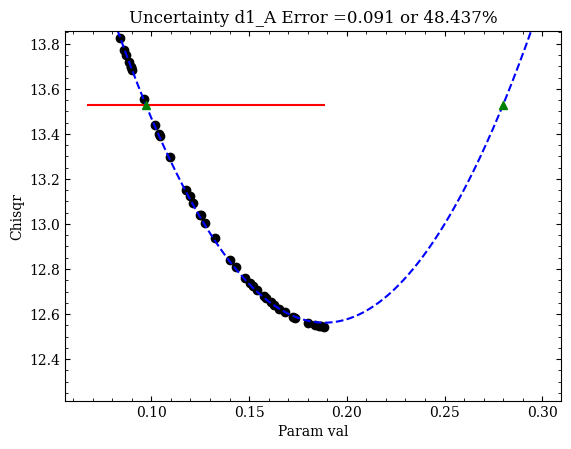

[====================                    ] 1/2 ( 50%) 1 to go

Evaluating Uncertainty for d2_A
Enable show_plots=True and check quality of initial fit.


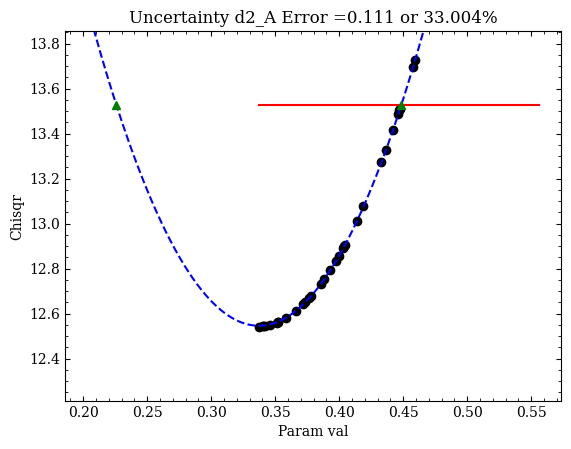

[========================================] 2/2 (100%) 0 to go

In [47]:
#Calculate parameter uncertainties
sqT_param_errs = bnrof.calculate_param_uncertainty(sqFq,fit_errT,sqT_model,sqT_params,sq_resultT,independent_vars={'Q':q_arr,'FF':ff},\
                                                       extrapolate=True,show_plots=True,fname='Calculated Uncertainties/sqT_test2_trimer.txt',\
                                                     overwrite_prev=True,fast_calc=False)
sqR_param_errs = bnrof.calculate_param_uncertainty(sqFq,fit_errT,model,params,result_ru,independent_vars={'Q':q_arr,'FF':ff},\
                                                       extrapolate=True,show_plots=True,fname='Calculated Uncertainties/sqT_test2_Ru.txt',\
                                                     overwrite_prev=True,fast_calc=False)

## Paper figure for factorizations and fits given below.

CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.02 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.01 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.02 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] MagFormFactorCorrection started
MagFormFactorCorrection-[Notice] MagFormFactorCorrection successful, Duration 0.00 seconds
CreateWorkspace-[Notice] CreateWorkspace started
CreateWorkspace-[Notice] CreateWorkspace successful, Duration 0.00 seconds
MagFormFactorCorrection-[Notice] Mag

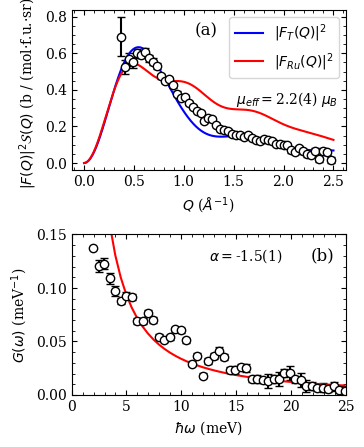

In [48]:
plt.rcParams['font.size']=10
q_eval = np.linspace(0.001,2.5,1000)
ff_eval = 1.0/(bnrof.get_MANTID_magFF(q_eval,'Ru0')[1])

comps_Ru = result_ru.eval_components(Q=q_eval,FF=ff_eval,dovec=do)
comps_T = sq_resultT.eval_components(Q=q_eval,FF_ion=ff_eval,dovec=do)
eval_Trimer = sq_resultT.eval(Q=q_eval,FF_ion=ff_eval,dovec=do)
eval_Ru = result_ru.eval(Q=q_eval,FF=ff_eval)

fig,ax = plt.subplots(2,1,figsize=(3.54,5))
fig.subplots_adjust(hspace=0.4)
geErr[geErr>np.nanmean(geErr)*10.0]=np.nanmean(geErr)
ax[1].errorbar(e,ge,yerr=geErr,color='k',marker='o',ls=' ',capsize=3,mfc='w',mec='k')
ax[1].set_ylim(0,0.15)
ax[1].set_xlim(0,25)
ax[1].plot(e,geresult.best_fit,'r-')
#ax[0].set_ylim(0,0.2)

ax[0].errorbar(q,sqFq,yerr=sqFqErr,color='k',marker='o',ls=' ',capsize=3,mfc='w',mec='k')
ax[0].plot(q_eval,eval_Trimer,'b-',label='$|F_{T}(Q)|^2$')
ax[0].plot(q_eval,eval_Ru,'r-',label='$|F_{Ru}(Q)|^2$')
ax[0].set_xlabel("$Q$ ($\AA^{-1}$)")
ax[0].set_ylabel("$|F(Q)|^2{\cal S}(Q)$ (b / (mol$\cdot$f.u.$\cdot$sr))")
ax[1].set_ylabel('$G(\omega)$ (meV$^{-1}$)')
ax[0].legend(fontsize=10)
ax[1].set_xlabel('$\hbar\omega$ (meV)')
ax[0].text(0.45,0.92,'(a)',transform=ax[0].transAxes,
           horizontalalignment='left',verticalalignment='top',fontsize=12)
ax[1].text(0.87,0.92,'(b)',transform=ax[1].transAxes,horizontalalignment='left',
           verticalalignment='top',fontsize=12)

print(sq_resultT.fit_report())
print(result_ru.fit_report())

ru_eval = model.eval(Q=q_eval,params=result_ru.params,FF=ff_eval)
trimer_eval = model_trimer.eval(Q=q_eval,FF_ion=ff_eval,params=trimer_result.params)

sq_eval = trimer_eval/ff_trimer_avg
sq_qsqr_int = np.trapz(x=q_arr,y=(sqFq/ff_trimer_arr) * q_arr**2) #This method uses the data points
#sq_qsqr_int = np.trapz(x=q_eval,y=(sq_eval_mu/ff_trimer_avg) * q_eval**2) #This method uses the fit
qsqr_int = np.trapz(x=q_eval,y=q_eval**2)
g=2.0
mu_eff = np.sqrt((3.0* g**2)*sq_qsqr_int / qsqr_int)
print('mu_eff = '+str(mu_eff))
alpha = geresult.params['alpha'].value
ax[0].text(0.6,0.5,"$\mu_{eff}=$"+f"{mu_eff:.1f}(4)"+" $\mu_B$",
           transform=ax[0].transAxes,horizontalalignment='left',verticalalignment='top',fontsize=10)
ax[1].text(0.5,0.92,r"$\alpha=$"+f"{alpha:.1f}(1)",transform=ax[1].transAxes,
           horizontalalignment='left',verticalalignment='top',fontsize=10)

fig.savefig('SEQ_figs/bnro_factorizations.pdf',bbox_inches='tight')

## Get estimates of the exchange interactions in each model.

In [50]:
mean_omega = np.trapz(x=e,y=e*ge)
num_bond=6.0
#To get the energies, need to get SS functions
moment_ratio =  2.2**2 / 1.2**2 
ss_nn_ru = 1.1*moment_ratio
ss_nn_t = 1.5*moment_ratio
ss_nnn_ru = -0.6*moment_ratio
ss_nnn_t = -0.8*moment_ratio

ss_nn_ru_err = 0.3*moment_ratio
ss_nn_t_err = 0.2*moment_ratio
ss_nnn_ru_err = 0.6*moment_ratio
ss_nnn_t_err = 0.3*moment_ratio

print(f"<hw>={mean_omega:.2f} meV")

J1_NN_SS_T = 3.0*mean_omega* sq_resultT.params['NN_A'].value/(num_bond)
J1_NN_SS_T_err = sqT_param_errs['NN_A']*3.0*mean_omega/(num_bond)
print(f"Trimer J1 SS = {J1_NN_SS_T:.1f}({J1_NN_SS_T_err:.1f})")
J1_NNN_SS_T = 3.0*mean_omega* sq_resultT.params['NNN_A'].value/(num_bond)
J1_NNN_SS_T_err =  sqT_param_errs['NNN_A']*3.0*mean_omega/(num_bond)
print(f"Trimer J2 SS = {J1_NNN_SS_T:.1f}({J1_NNN_SS_T_err:.1f})")

J1_NN_SS_R = 3.0*mean_omega* result_ru.params['d1_A'].value/(num_bond)
J1_NN_SS_R_err = sqR_param_errs['d1_A']*3.0*mean_omega/(num_bond)
print(f"Ru J1 SS= {J1_NN_SS_R:.1f}({J1_NN_SS_R_err:.1f})")
J1_NNN_SS_R = 3.0*mean_omega* result_ru.params['d2_A'].value/(num_bond)
J1_NNN_SS_R_err = sqR_param_errs['d2_A']*3.0*mean_omega/(num_bond)
print(f"Ru J2 SS = {J1_NNN_SS_R:.1f}({J1_NNN_SS_R_err:.1f})")
print('    ')
alpha = geresult.params['alpha'].value
alpha_err = gefit_param_errs['alpha']
print(f'Alpha = {alpha:.2f}({alpha_err:.2f})')
print('mu_eff = '+f"{mu_eff:.1f}({mu_eff*0.2:.1f})")
print('    ')
J1_NN_T = 3.0*mean_omega* sq_resultT.params['NN_A'].value/(num_bond*ss_nn_t)
J1_NN_T_err = 3.0*mean_omega/(num_bond*ss_nn_t)* sq_resultT.params['NN_A'].value * np.sqrt((sqT_param_errs['NN_A'] / sq_resultT.params['NN_A'].value)**2 + (ss_nn_t_err / ss_nn_t)**2)
print(f"Trimer J1 = {J1_NN_T:.1f}({J1_NN_T_err:.1f})")
J1_NNN_T = 3.0*mean_omega* sq_resultT.params['NNN_A'].value/(num_bond*ss_nn_t)
J1_NNN_T_err = 3.0*mean_omega* sq_resultT.params['NNN_A'].value/(num_bond*ss_nnn_t)* np.sqrt((sqT_param_errs['NNN_A'] / sq_resultT.params['NNN_A'].value)**2 + (ss_nnn_t_err / ss_nnn_t)**2)
print(f"Trimer J2 = {J1_NNN_T:.1f}({J1_NNN_T_err:.1f})")

J1_NN_R = 3.0*mean_omega* result_ru.params['d1_A'].value/(num_bond*ss_nn_ru)
J1_NN_R_err = 3.0*mean_omega/(num_bond*ss_nn_ru)* result_ru.params['d1_A'].value * np.sqrt((sqR_param_errs['d1_A'] / result_ru.params['d1_A'].value)**2 + (ss_nn_ru_err / ss_nn_ru)**2)
print(f"Ru J1 = {J1_NN_R:.1f}({J1_NN_R_err:.1f})")
J1_NNN_R = 3.0*mean_omega* result_ru.params['d2_A'].value/(num_bond*ss_nnn_ru)
J1_NNN_R_err = 3.0*mean_omega/(num_bond*ss_nnn_ru)* result_ru.params['d2_A'].value * np.sqrt((sqR_param_errs['d2_A'] / result_ru.params['d2_A'].value)**2 + (ss_nnn_ru_err / ss_nnn_ru)**2)
print(f"Ru J2 = {J1_NNN_R:.1f}({J1_NNN_R_err:.1f})")



<hw>=8.12 meV
Trimer J1 SS = 3.2(0.2)
Trimer J2 SS = 0.4(0.3)
Ru J1 SS= 0.8(0.4)
Ru J2 SS = 1.4(0.5)
    
Alpha = -1.47(0.03)
mu_eff = 2.2(0.4)
    
Trimer J1 = 0.6(0.1)
Trimer J2 = 0.1(-0.1)
Ru J1 = 0.2(0.1)
Ru J2 = -0.7(-0.7)
